<a href="https://colab.research.google.com/github/Naveen-01A/ML_Customer_Care_Segmemtation/blob/main/2_Myntra_Online_Retail_Customer_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


In [ ]:
# To read the Dataset
# in case of, its show show data can't be readable then use , 'encoding = ISO-8859-1' after the file path
retail_df = pd.read_csv('/content/Online Retail.xlsx -my.csv')


### Dataset Description:
Variable	:- Description

InvoiceNo	:- Code representing each unique transaction. If this code starts wi

StockCode	:- Code uniquely assigned to each distinct product.

Description	:- Description of each product.

Quantity	:- The number of units of a product in a transaction.

InvoiceDate	:- The date and time of the transaction.

UnitPrice	:- The unit price of the product in sterling.

CustomerID	:- Identifier uniquely assigned to each customer.

Country	:- The country of the customer.

### Dataset First View

First I will perform a preliminary analysis to understand the structure and types of data columns:

In [ ]:
# To read the top 5 records of the dataset
retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/10 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/10 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/10 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/10 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/10 8:26,3.39,17850.0,United Kingdom


In [ ]:
retail_df.tail()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/11 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/11 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/11 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/11 12:50,4.15,12680.0,France
541908,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,12/9/11 12:50,4.95,12680.0,France


### Dataset Rows & Columns count

In [ ]:
#To know the rows and columns of the dataset
retail_df.shape

(541909, 8)

### Dataset Information

In [ ]:
# Checking the datatypes and Nu values in the dataset

retail_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


###**Observations**
* CustomerID: A float column that contains the customer ID for each transaction. This column has a significant number of missing values, with only 406,829 non-null entries out of 541,909.

* InvoiceDate: A datetime column that records the date and time of each transaction. Datatype of InvoiceDate is needs to convert it into datetime.

* If the InvoiceNo starts with C means it's a cancellation. We need to drop this records.

* Description: This column, also an object data type, contains descriptions of the products. It has some missing values, with 540,455 non-null entries out of 541,909.


#### Duplicate Values

In [ ]:
retail_df.duplicated().value_counts()

,count
False,536641
True,5268


#### Missing Values/Null Values

In [ ]:
# Checking and visualazing the null values

retail_df.isnull().sum().sort_values(ascending=False)

,0
CustomerID,135080
Description,1454
InvoiceNo,0
StockCode,0
Quantity,0
InvoiceDate,0
UnitPrice,0
Country,0


Text(0.5, 1.0, 'Missing Values Visualising')

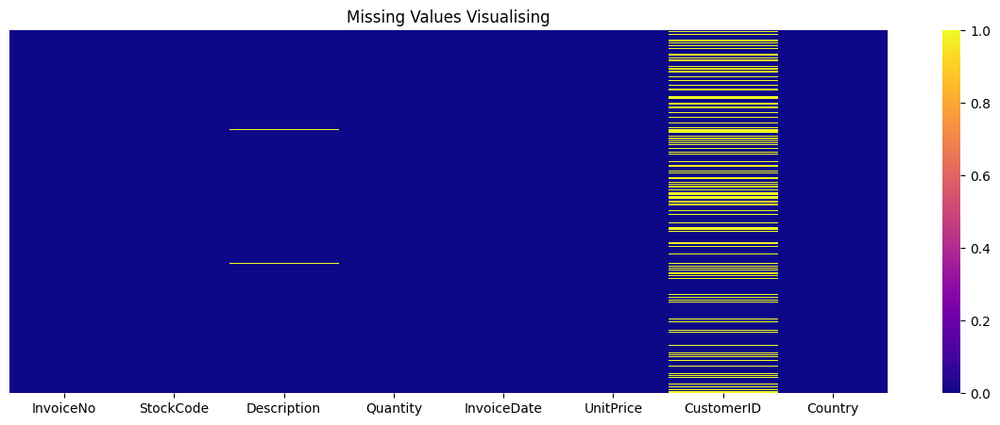

In [ ]:
plt.figure(figsize=(15,5))
sns.heatmap(retail_df.isnull(), cmap = 'plasma',annot = False, yticklabels=False)
plt.title('Missing Values Visualising')

**Observation**

Here, we can observe the Presence of Missing values in CustomerId and Description

Dropping all the rows with Missing values in the dataset,because the CustomerId is our main feature for data analysis.

#### Understanding Your Variables

In [ ]:
retail_df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [ ]:
retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


*

#### **Variables Description**
Invoice: Unique transaction identifier (categorical).

StockCode: Unique product identifier (categorical).

Description: Text description of products (categorical).

Quantity: Number of units purchased in a transaction (numerical).

InvoiceDate: Date and time of the transaction (datetime).

Price: Price per unit of the product (numerical).

CustomerID: Unique identifier for customers (categorical).

Country: Country where the purchase was made (categorical).

#### Check Unique Values for each variable.

In [ ]:
# Display unique value Counts for each column

for col in retail_df.columns:
  print(f'{col}: {retail_df[col].nunique()} unique values')

InvoiceNo: 25900 unique values
StockCode: 4070 unique values
Description: 4223 unique values
Quantity: 722 unique values
InvoiceDate: 23260 unique values
UnitPrice: 1630 unique values
CustomerID: 4372 unique values
Country: 38 unique values


In [ ]:
retail_df.shape

(541909, 8)

#### Dropping null values:

In [ ]:
retail_df.dropna(inplace=True)

In [ ]:
retail_df.shape

(406829, 8)

In [ ]:
retail_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    406829 non-null  object 
 1   StockCode    406829 non-null  object 
 2   Description  406829 non-null  object 
 3   Quantity     406829 non-null  int64  
 4   InvoiceDate  406829 non-null  object 
 5   UnitPrice    406829 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      406829 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 27.9+ MB


After droping of rows with Missing values , we have 406829 rows and 8 columns

In [ ]:
retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,406829.000000,406829.000000,406829.000000
mean,12.061303,3.460471,15287.690570
std,248.693370,69.315162,1713.600303
min,-80995.000000,0.000000,12346.000000
25%,2.000000,1.250000,13953.000000
50%,5.000000,1.950000,15152.000000
75%,12.000000,3.750000,16791.000000
max,80995.000000,38970.000000,18287.000000


* Here we observe that the Unit price has Min value '0'. Free Products are avaliable.

* There Is presence of Negative value in the Quantity column.

So, we have to remove all thows records from dataset to it more effective.


### **Data Wrangling**

In [ ]:
retail_df = retail_df.drop_duplicates()

In [ ]:
retail_df.shape

(401604, 8)

In [ ]:
# checking for the negative values in quantity

retail_df[retail_df['Quantity'] < 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,12/1/10 9:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/10 9:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/10 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/10 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/10 10:24,0.29,17548.0,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,12/9/11 9:57,0.83,14397.0,United Kingdom
541541,C581499,M,Manual,-1,12/9/11 10:28,224.69,15498.0,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,12/9/11 11:57,10.95,15311.0,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,12/9/11 11:58,1.25,17315.0,United Kingdom


In [ ]:
# If the InvoiceNo starts with C means, it's a cancellation. So, we need to drop them
retail_df['InvoiceNo'] = retail_df['InvoiceNo'].astype('str')

In [ ]:
retail_df = retail_df[~retail_df['InvoiceNo'].str.contains('C')]

In [ ]:
# Checking for the Products with Unit price as "0"

len(retail_df[retail_df['UnitPrice']==0])

40

In [ ]:
retail_df = retail_df[retail_df['UnitPrice']>0]
retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/10 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/10 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/10 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/10 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/10 8:26,3.39,17850.0,United Kingdom


In [ ]:
retail_df.shape

(392692, 8)

In [ ]:
# Again checking the statical data of the dataset after transformation
retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,392692.000000,392692.000000,392692.000000
mean,13.119702,3.125914,15287.843865
std,180.492832,22.241836,1713.539549
min,1.000000,0.001000,12346.000000
25%,2.000000,1.250000,13955.000000
50%,6.000000,1.950000,15150.000000
75%,12.000000,3.750000,16791.000000
max,80995.000000,8142.750000,18287.000000


In [ ]:
for col in retail_df.columns:
  print(f'{col}: {retail_df[col].nunique()} unique values')

InvoiceNo: 18532 unique values
StockCode: 3665 unique values
Description: 3877 unique values
Quantity: 301 unique values
InvoiceDate: 17282 unique values
UnitPrice: 440 unique values
CustomerID: 4338 unique values
Country: 37 unique values


In [ ]:
retail_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 392692 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    392692 non-null  object 
 1   StockCode    392692 non-null  object 
 2   Description  392692 non-null  object 
 3   Quantity     392692 non-null  int64  
 4   InvoiceDate  392692 non-null  object 
 5   UnitPrice    392692 non-null  float64
 6   CustomerID   392692 non-null  float64
 7   Country      392692 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 27.0+ MB


In [ ]:
retail_df['InvoiceDate'] = pd.to_datetime(retail_df['InvoiceDate'])

### **Handling Outliers**

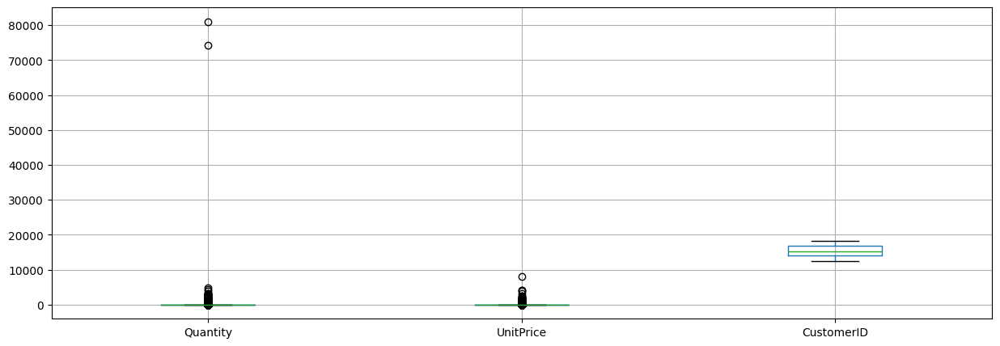

In [ ]:
# Checking for outliers
retail_df.boxplot(figsize= (15,5))
plt.show()

In [ ]:
#retail_df = retail_df[retail_df['Quantity']>20000]

In [ ]:
retail_df.shape

(392692, 8)

###Feature Engineering

In [ ]:
# Extract date-related features
retail_df['InvoiceDate'] = pd.to_datetime(retail_df['InvoiceDate'])
retail_df['Year'] = retail_df['InvoiceDate'].dt.year
retail_df['Month'] = retail_df['InvoiceDate'].dt.month
retail_df['Day'] =retail_df['InvoiceDate'].dt.day
retail_df['Hour'] = retail_df['InvoiceDate'].dt.hour

In [ ]:
retail_df['Revenue'] = retail_df['Quantity'] * retail_df['UnitPrice']

In [ ]:
retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,Day,Hour,Revenue
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,12,1,8,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,12,1,8,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,20.34


## EDA -Exploratory Data Analysis

In [ ]:
retail_df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Year', 'Month', 'Day', 'Hour',
       'Revenue'],
      dtype='object')

In [ ]:
#Finding the number of Unique stock codes

unique_stock_code = retail_df['StockCode'].nunique()
# Printing the number of unique stock codes

print(f'The number of unique stock codes in the dataset is : {unique_stock_code}')

The number of unique stock codes in the dataset is : 3665


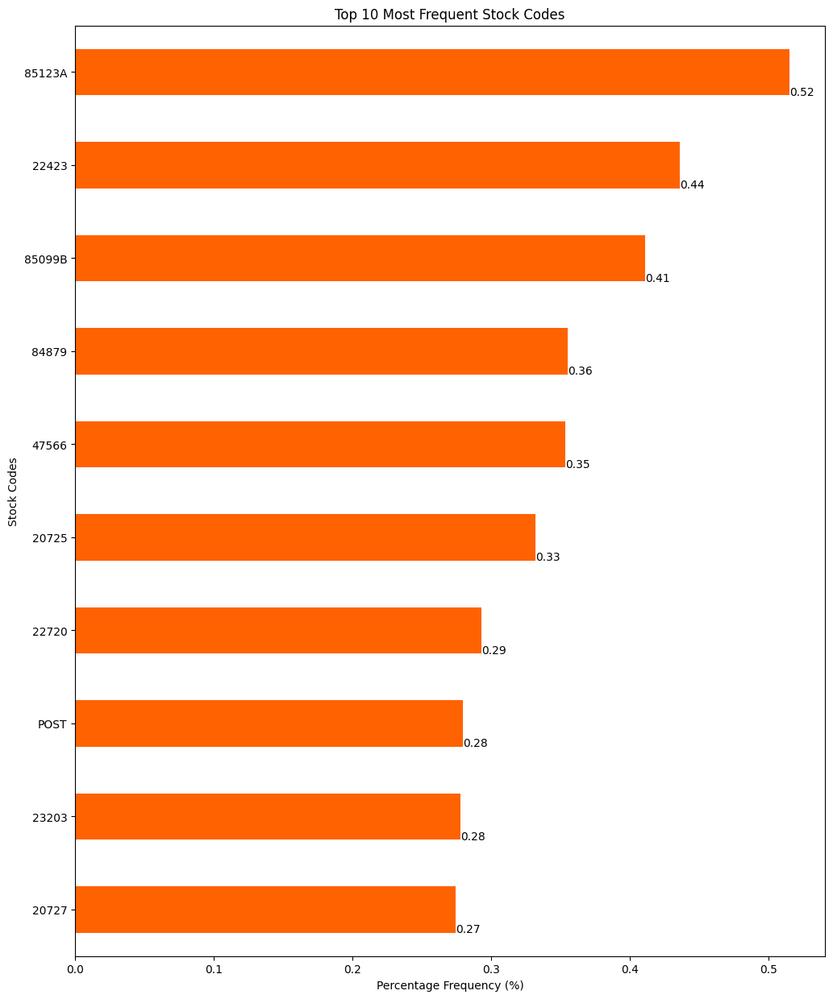

In [ ]:
# Finding the  top most frequent stock codes

top_10_stock_codes = retail_df['StockCode'].value_counts(normalize= True).head(10)*100

#Plotting the top 10 most frequent stock codes
plt.figure(figsize=(12,15))
top_10_stock_codes.plot(kind= 'barh', color = '#ff6200')

#Adding the percentage frequency on the bars
for index,value in enumerate(top_10_stock_codes):
  plt.text(value, index+0.25, f'{value:.2f}', fontsize = 10)

plt.title('Top 10 Most Frequent Stock Codes')
plt.xlabel('Percentage Frequency (%)')
plt.ylabel('Stock Codes')
plt.gca().invert_yaxis()
plt.show()

### Top Country wise Sales

In [ ]:
Top_country = retail_df['Country'].value_counts()
Top_country.head()

,count
Country,
United Kingdom,349203
Germany,9025
France,8326
EIRE,7226
Spain,2479


### Top Countries Visualization

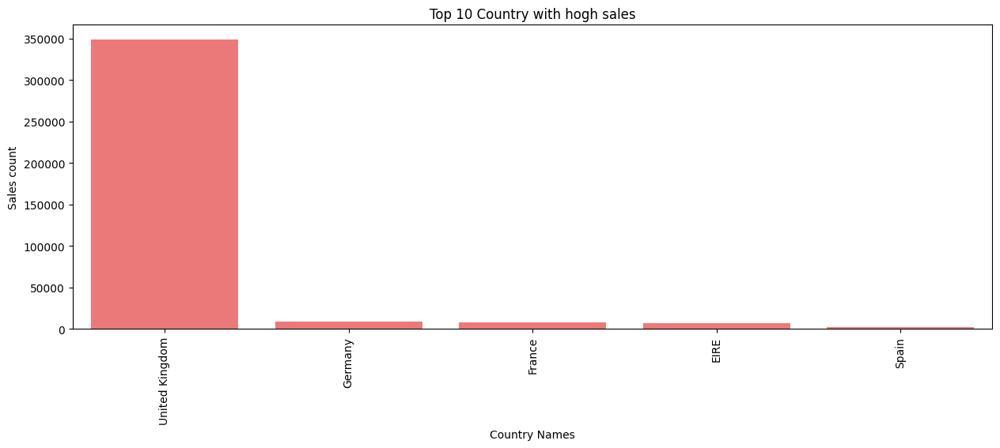

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 5))
sns.barplot(x=Top_country[:5].index, y=Top_country[:5].values, color = '#f66f')
plt.xlabel('Country Names')
plt.ylabel('Sales count')
plt.title('Top 10 Country with hogh sales')
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
Top_country.tail()

,count
Country,
Lithuania,35
Brazil,32
Czech Republic,25
Bahrain,17
Saudi Arabia,9


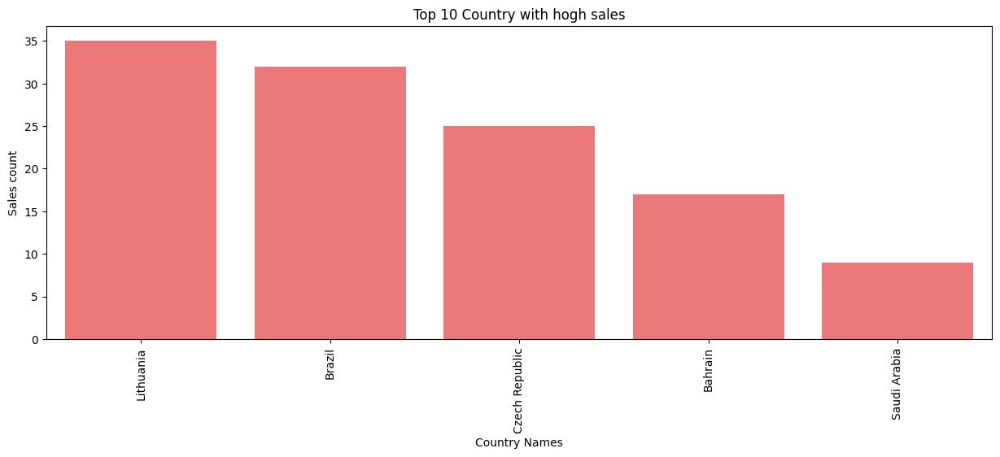

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 5))
sns.barplot(x=Top_country[-5:].index, y=Top_country[-5:].values, color = '#f66f')
plt.xlabel('Country Names')
plt.ylabel('Sales count')
plt.title('Top 10 Country with hogh sales')
plt.xticks(rotation='vertical')
plt.show()

### Top Sold Products

In [ ]:
# Find top sales of products by description
Top_products = retail_df['Description'].value_counts().head(10)
Top_products

,count
Description,
WHITE HANGING HEART T-LIGHT HOLDER,2016
REGENCY CAKESTAND 3 TIER,1713
JUMBO BAG RED RETROSPOT,1615
ASSORTED COLOUR BIRD ORNAMENT,1395
PARTY BUNTING,1389
LUNCH BAG RED RETROSPOT,1303
SET OF 3 CAKE TINS PANTRY DESIGN,1152
POSTAGE,1099
LUNCH BAG BLACK SKULL.,1078


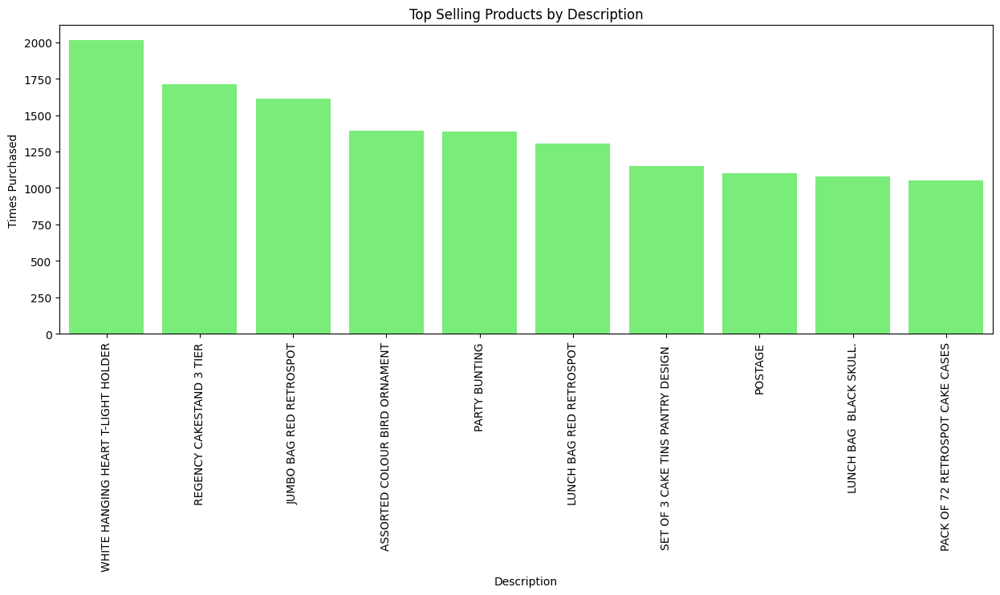

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 5))
sns.barplot(x=Top_products.index, y=Top_products.values, color = '#6f6f')
plt.title('Top Selling Products by Description')
plt.xlabel('Description')
plt.ylabel('Times Purchased')
plt.xticks(rotation = 'vertical')
plt.show()

### Least Sold Products

In [ ]:
Top_products.tail(10)

,count
Description,
WHITE HANGING HEART T-LIGHT HOLDER,2016
REGENCY CAKESTAND 3 TIER,1713
JUMBO BAG RED RETROSPOT,1615
ASSORTED COLOUR BIRD ORNAMENT,1395
PARTY BUNTING,1389
LUNCH BAG RED RETROSPOT,1303
SET OF 3 CAKE TINS PANTRY DESIGN,1152
POSTAGE,1099
LUNCH BAG BLACK SKULL.,1078


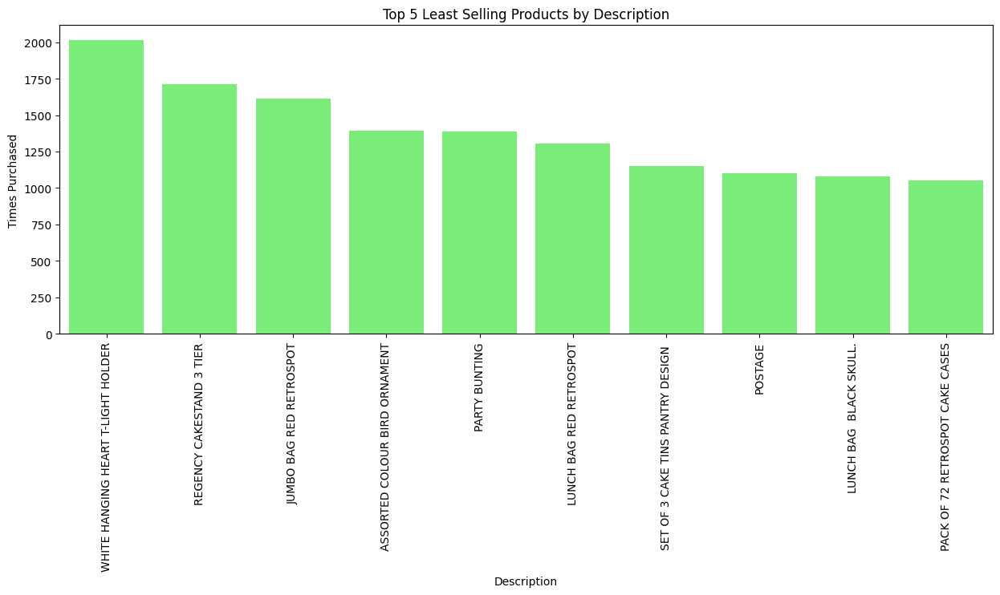

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 5))
sns.barplot(x=Top_products[-10:].index, y=Top_products[-10:].values, color = '#6f6f')
plt.title('Top 5 Least Selling Products by Description')
plt.xlabel('Description')
plt.ylabel('Times Purchased')
plt.xticks(rotation = 'vertical')
plt.show()

### Top 10 items in terms of StockCode

In [ ]:
top_10_stock_codes = retail_df['StockCode'].value_counts()
top_10_stock_codes.head(10)

,count
StockCode,
85123A,2023
22423,1713
85099B,1615
84879,1395
47566,1389
20725,1304
22720,1152
POST,1099
23203,1091


Text(0.5, 1.0, 'Top 10 products in terms of Stock Code')

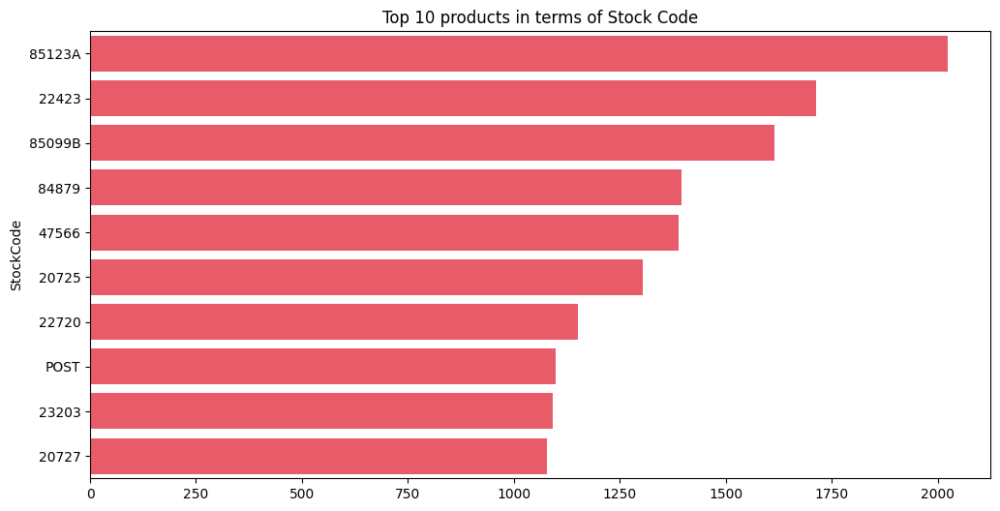

In [ ]:
plt.figure(figsize= (12, 6))
sns.barplot(y=top_10_stock_codes[:10].index, x= top_10_stock_codes[:10].values, color ='#f45f')
plt.title('Top 10 products in terms of Stock Code')

In [ ]:
# Top 10 Least sales by StockCode

top_10_stock_codes.tail(10)

,count
StockCode,
84802A,1
90033,1
90027A,1
90027D,1
90183C,1
90059A,1
20678,1
90059D,1
90168,1


Text(0.5, 1.0, 'Top least sales 10 products in terms of Stock Code')

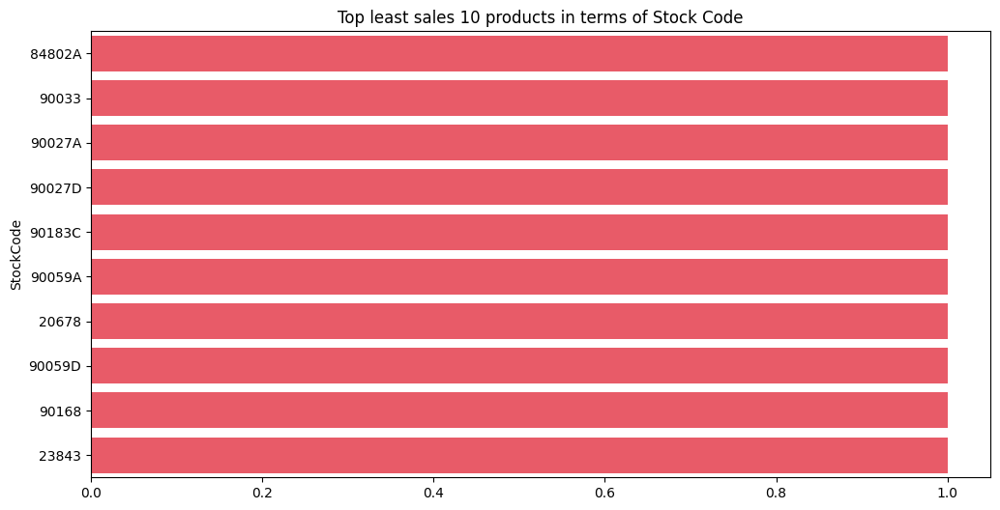

In [ ]:
plt.figure(figsize= (12, 6))
sns.barplot(y=top_10_stock_codes[-10:].index, x= top_10_stock_codes[-10:].values, color ='#f45f')
plt.title('Top least sales 10 products in terms of Stock Code')

### Sales by Top 10 CustomerID

In [ ]:
top_10_customer = retail_df['CustomerID'].value_counts().reset_index().rename(columns={'index':'CustomerId','count':'Product_puschasing_count'})
top_10_customer.head(10)

,CustomerID,Product_puschasing_count
0,17841.0,7676
1,14911.0,5670
2,14096.0,5111
3,12748.0,4412
4,14606.0,2677
5,15311.0,2366
6,14646.0,2076
7,13089.0,1814
8,13263.0,1667
9,14298.0,1637


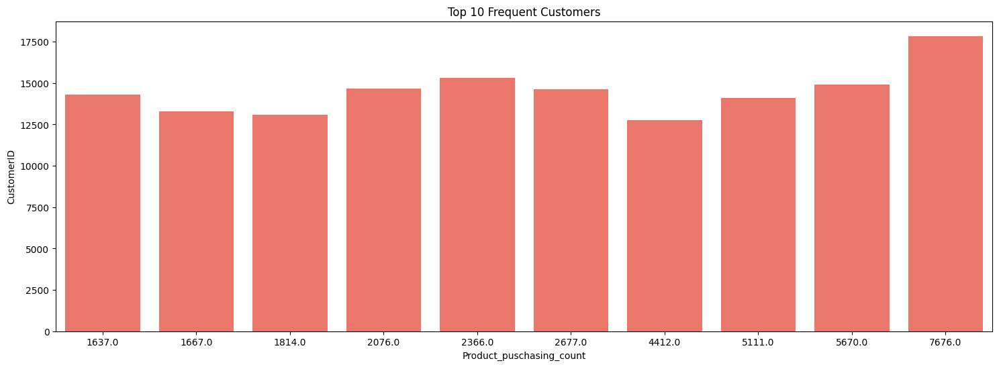

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))

# Correcting the typo in the function name
sns.barplot(y=top_10_customer['CustomerID'], x=top_10_customer['Product_puschasing_count'].head(10), color='#f65f')
plt.title('Top 10 Frequent Customers')

plt.show()


In [ ]:
top_10_customer['Product_puschasing_count'].tail(10)

,Product_puschasing_count
4328,1
4329,1
4330,1
4331,1
4332,1
4333,1
4334,1
4335,1
4336,1
4337,1


In [ ]:
monthly_sales=retail_df['Month'].value_counts()
monthly_sales.head()

,count
Month,
11,63168
10,48793
12,42696
9,39669
5,28073


In [ ]:
monthly_sales=retail_df['Month'].value_counts().reset_index().rename(columns={'sales_count': 'Month_Number','count': 'sales_count'})
monthly_sales

,Month,sales_count
0,11,63168
1,10,48793
2,12,42696
3,9,39669
4,5,28073
5,6,26926
6,3,26870
7,8,26790
8,7,26580
9,4,22433


Text(0.5, 1.0, 'Sales count various Months wise')

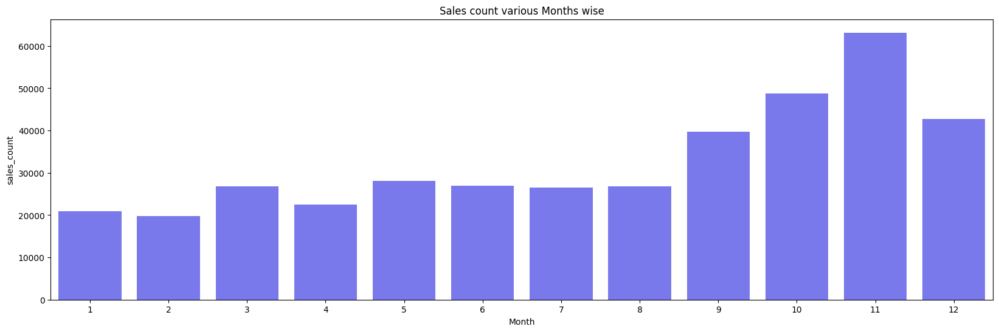

In [ ]:
# Sales count during different months
plt.figure(figsize=(20,6))
sns.barplot(x=monthly_sales['Month'], y = monthly_sales['sales_count'], color = '#66ff')
plt.title('Sales count various Months wise')

In [ ]:
retail_df['Day'].value_counts()

,count
Day,
6,18076
5,16127
8,15621
7,15426
17,14729
4,14632
20,14404
23,14092
14,14013


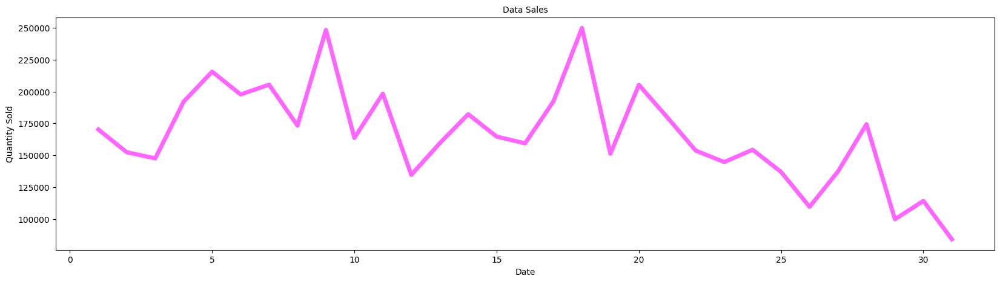

In [ ]:
daily_sales = retail_df[['Day', 'Quantity']].groupby('Day').sum()
plt.figure(figsize=(20, 5))
plt.title('Data Sales', fontsize=10)
sns.lineplot(x=daily_sales.index, y=daily_sales['Quantity'], color='#f6ff', linewidth=5)
plt.xlabel('Date')
plt.ylabel('Quantity Sold')
plt.show()

<Axes: title={'center': 'Hourly Sales'}, xlabel='Hour', ylabel='Quantity'>

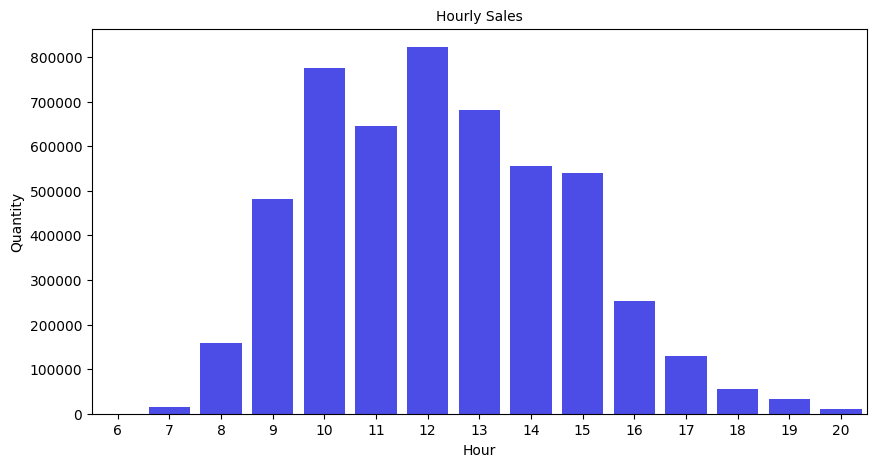

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
hourly_sales = retail_df[['Hour', 'Quantity']].groupby('Hour').sum()
plt.figure(figsize=(10, 5))
plt.title('Hourly Sales', fontsize=10)
sns.barplot(x=hourly_sales.index, y= hourly_sales['Quantity'],color='#33f3')

In [ ]:
def day_period(time):
  if (time<=11):
    return 'Morning Sales'
  elif(12<=time<=16):
    return 'Afternoon Sales'
  else:
    return 'Evening Sales'


In [ ]:
retail_df['day_sales_time'] = retail_df['Hour'].apply(day_period)

In [ ]:
sales_timing = retail_df['day_sales_time'].value_counts().reset_index().rename(columns = {'day_sales_time':'Day_time_type','count':'Sales_count'})
sales_timing

,Day_time_type,Sales_count
0,Afternoon Sales,255713
1,Morning Sales,117132
2,Evening Sales,19847


Text(0.5, 1.0, 'Sales during different day period')

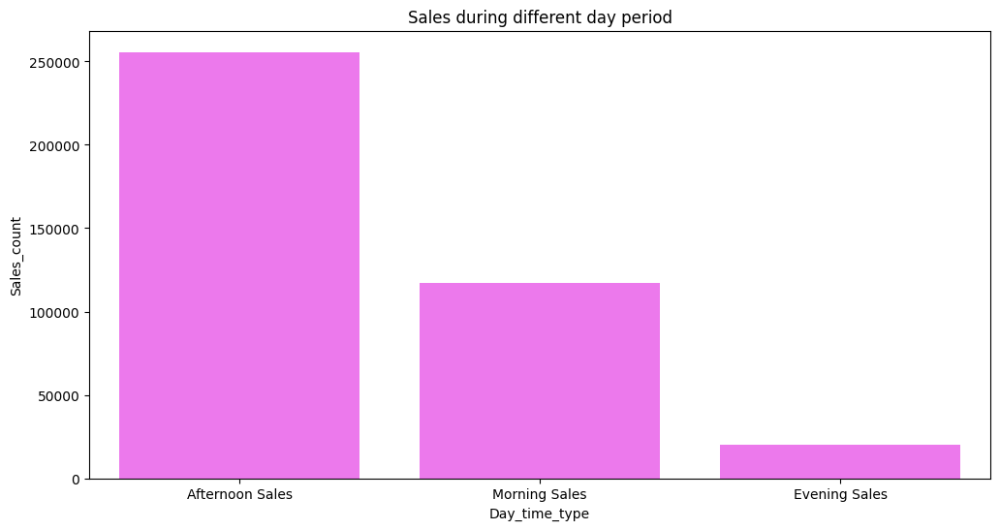

In [ ]:
# Sales Count on different times of a day

plt.figure(figsize= (12, 6))
sns.barplot(x = sales_timing['Day_time_type'], y = sales_timing['Sales_count'],color = '#f6ff')
plt.title('Sales during different day period')

### **Observations**
* Afternoon is the most favourable time for people for Shopping.
* Leasted Intrested in Evening time.

In [ ]:
retail_df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Year', 'Month', 'Day', 'Hour',
       'Revenue', 'day_sales_time'],
      dtype='object')

In [ ]:
Avg_amount = retail_df.groupby('CustomerID')['Revenue'].mean().reset_index().rename(columns = {'Revenue':'Avg_amount_spend_by_customer'}).sort_values('Avg_amount_spend_by_customer',ascending=False)

In [ ]:
Avg_amount

,CustomerID,Avg_amount_spend_by_customer
0,12346.0,77183.600000
3008,16446.0,56157.500000
2011,15098.0,13305.500000
2502,15749.0,4453.430000
2087,15195.0,3861.000000
...,...,...
3590,17254.0,2.443153
697,13271.0,2.430920
990,13684.0,2.245862
3995,17816.0,2.150588


Text(0.5, 1.0, 'Average Amount spend by each Customer')

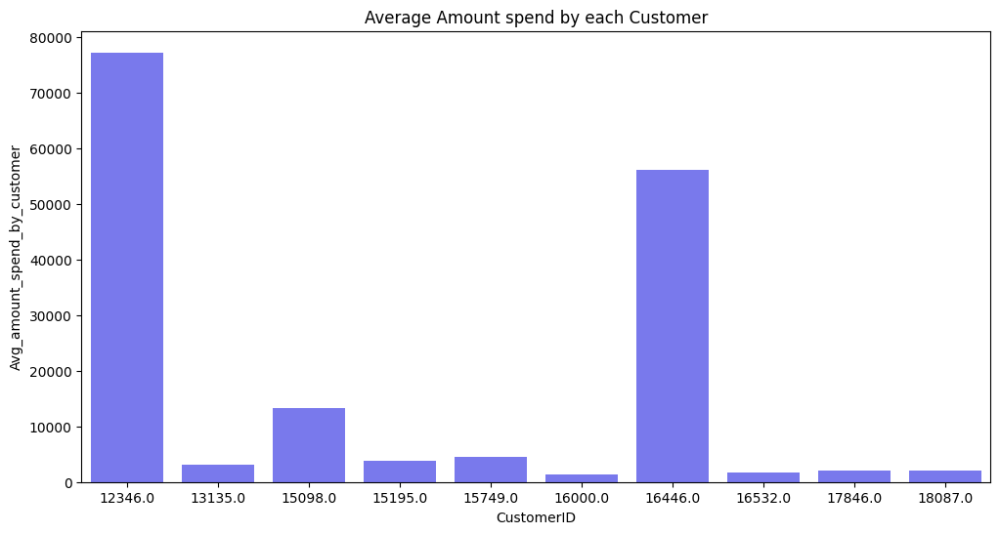

In [ ]:
# Average amount spend by each Customer
plt.figure(figsize= (12, 6))
sns.barplot(x =Avg_amount['CustomerID'].head(10), y = Avg_amount['Avg_amount_spend_by_customer'], color='#66ff')
plt.title('Average Amount spend by each Customer')

### **Observation**

* 12346 CustomerID has Spend the highest average amount of 77183.60 (Dollars)
* 16446 CustomerID has Spend the 2nd highest average amount of 56157.50 (Dollars)

# **Model Building**

 # RFM Analysis
RFM (**Recency, Frequency, Monetary**) analysis is a customer segmentation technique that uses past purchase behavior to divide customers into groups.

RFM helps divide customers into various categories or clusters to identify customers who are more likely to respond to promotions and also for future personalization services.

* **RECENCY (R)**: Days since last purchase
* **FREQUENCY (F)**: Total number of purchases
* **MONETARY VALUE (M)**: Total money this customer spent.

We will create those 3 customer attributes for each customer.



## **Recency**

To calculate recency, we need to choose a date point from which we evaluate how many days ago was the customer's last purchase.

In [ ]:
#last date available in our dataset

retail_df['InvoiceDate'].max()

Timestamp('2011-12-09 12:50:00')

In [ ]:
# Create a new column called 'date' which contains to datatime format
retail_df['date'] = retail_df['InvoiceDate'].dt.date

In [ ]:
recency_df = retail_df.groupby(by='CustomerID', as_index=False)['date'].max()
recency_df.columns =['CustomerID','LastPurchase_Date']
recency_df

,CustomerID,LastPurchase_Date
0,12346.0,2011-01-18
1,12347.0,2011-12-07
2,12348.0,2011-09-25
3,12349.0,2011-11-21
4,12350.0,2011-02-02
...,...,...
4333,18280.0,2011-03-07
4334,18281.0,2011-06-12
4335,18282.0,2011-12-02
4336,18283.0,2011-12-06


In [ ]:
recency_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4338 entries, 0 to 4337
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         4338 non-null   float64
 1   LastPurchase_Date  4338 non-null   object 
dtypes: float64(1), object(1)
memory usage: 67.9+ KB


In [ ]:
import datetime as dt

# Define the Latest Date of purchase, take it as'2011-12-10' becauce the last purchase date in dateset is '2011-12-09'

Latest_Date = dt.date(2011,12,10)

# Calculate recency
recency_df['Recency'] = recency_df['LastPurchase_Date'].apply(lambda x: (Latest_Date - x).days)


In [ ]:
recency_df.head()

,CustomerID,LastPurchase_Date,Recency
0,12346.0,2011-01-18,326
1,12347.0,2011-12-07,3
2,12348.0,2011-09-25,76
3,12349.0,2011-11-21,19
4,12350.0,2011-02-02,311


## **Frequency**

Frequency helps us to know how many times a customer purchased from us. To do that we need to check how many invoices are registered by the same customer.

In [ ]:
# Calculate the Frequency of Purchase

frequency_df = retail_df.groupby(by= ['CustomerID'], as_index=False)['InvoiceNo'].count()
frequency_df.columns = ['CustomerID', 'Frequency']
frequency_df.head()

,CustomerID,Frequency
0,12346.0,1
1,12347.0,182
2,12348.0,31
3,12349.0,73
4,12350.0,17


## **Monetary**
Monetary attribute answers the question: How much money did the customer spent over time?


To do that, first, we will create a new column total cost to have the total price per invoice.

In [ ]:
# The total spend of amount by each customer

monetary_df = retail_df.groupby(by='CustomerID', as_index=False).agg({'Revenue': 'sum'})
monetary_df.columns = ['CustomerID', 'Monetary']
monetary_df.head()

,CustomerID,Monetary
0,12346.0,77183.60
1,12347.0,4310.00
2,12348.0,1797.24
3,12349.0,1757.55
4,12350.0,334.40


## **Create RMF Table**

In [ ]:
# Merge recency Dataframe with Frequency dataframe

temp_df = recency_df.merge(frequency_df, on='CustomerID')
temp_df.head()

,CustomerID,LastPurchase_Date,Recency,Frequency
0,12346.0,2011-01-18,326,1
1,12347.0,2011-12-07,3,182
2,12348.0,2011-09-25,76,31
3,12349.0,2011-11-21,19,73
4,12350.0,2011-02-02,311,17


In [ ]:
# Merge with monetary dataframe to get a table with the 3 columns

rmf_df = temp_df.merge(monetary_df, on = 'CustomerID')

# use Customer as index
rmf_df.set_index('CustomerID', inplace=True)

rmf_df.head()

,LastPurchase_Date,Recency,Frequency,Monetary
CustomerID,,,,
12346.0,2011-01-18,326,1,77183.60
12347.0,2011-12-07,3,182,4310.00
12348.0,2011-09-25,76,31,1797.24
12349.0,2011-11-21,19,73,1757.55
12350.0,2011-02-02,311,17,334.40


In [ ]:
rmf_df.drop(columns='LastPurchase_Date', inplace=True)

In [ ]:
retail_df[retail_df['CustomerID']==18281.0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,Day,Hour,Revenue,day_sales_time,date
222954,556464,22037,ROBOT BIRTHDAY CARD,12,2011-06-12 10:53:00,0.42,18281.0,United Kingdom,2011,6,12,10,5.04,Morning Sales,2011-06-12
222955,556464,22716,CARD CIRCUS PARADE,12,2011-06-12 10:53:00,0.42,18281.0,United Kingdom,2011,6,12,10,5.04,Morning Sales,2011-06-12
222956,556464,22028,PENNY FARTHING BIRTHDAY CARD,12,2011-06-12 10:53:00,0.42,18281.0,United Kingdom,2011,6,12,10,5.04,Morning Sales,2011-06-12
222957,556464,23007,SPACEBOY BABY GIFT SET,1,2011-06-12 10:53:00,16.95,18281.0,United Kingdom,2011,6,12,10,16.95,Morning Sales,2011-06-12
222958,556464,23008,DOLLY GIRL BABY GIFT SET,1,2011-06-12 10:53:00,16.95,18281.0,United Kingdom,2011,6,12,10,16.95,Morning Sales,2011-06-12
222959,556464,23209,LUNCH BAG DOILEY PATTERN,10,2011-06-12 10:53:00,1.65,18281.0,United Kingdom,2011,6,12,10,16.50,Morning Sales,2011-06-12
222960,556464,22467,GUMBALL COAT RACK,6,2011-06-12 10:53:00,2.55,18281.0,United Kingdom,2011,6,12,10,15.30,Morning Sales,2011-06-12


In [ ]:
rmf_df.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,326,1,77183.60
12347.0,3,182,4310.00
12348.0,76,31,1797.24
12349.0,19,73,1757.55
12350.0,311,17,334.40


In [ ]:
rmf_df.describe()

,Recency,Frequency,Monetary
count,4338.000000,4338.000000,4338.000000
mean,93.059474,90.523744,2048.688081
std,100.012264,225.506968,8985.230220
min,1.000000,1.000000,3.750000
25%,18.000000,17.000000,306.482500
50%,51.000000,41.000000,668.570000
75%,142.750000,98.000000,1660.597500
max,374.000000,7676.000000,280206.020000


Text(0.5, 1.0, 'Distribution of Recency')

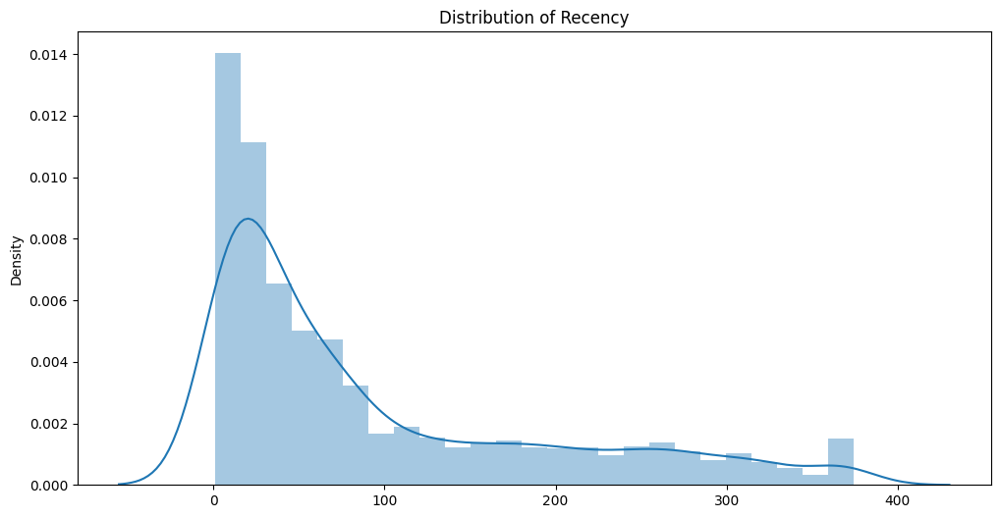

In [ ]:
plt.figure(figsize= (12, 6))
sns.distplot(x = rmf_df['Recency'])
plt.title('Distribution of Recency')

**Distribution of Recency is right Skewed.**

Text(0.5, 1.0, 'Distribution of Frequency')

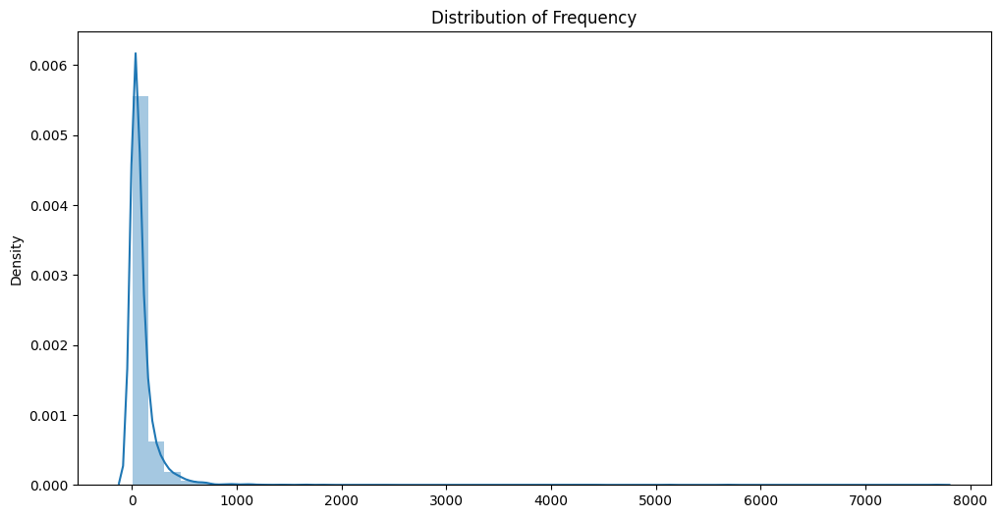

In [ ]:
plt.figure(figsize=(12,6))
sns.distplot(x = rmf_df['Frequency'])
plt.title('Distribution of Frequency')

**Distribution of Frequency is highly right skewed.**

Text(0.5, 1.0, 'Distribution of Monetary')

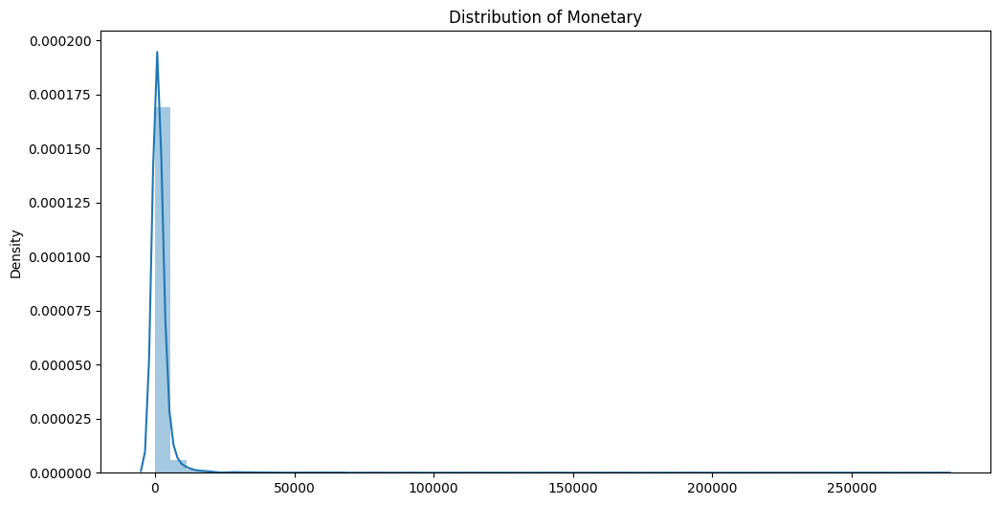

In [ ]:
plt.figure(figsize = (12,6))
sns.distplot(x=rmf_df['Monetary'])
plt.title('Distribution of Monetary')

**Distribution of Monetary is highly right skewed.**

In [ ]:
# Split the data into four segment using Quantile
quantile = rmf_df.quantile(q = [0.25, 0.50, 0.75])

In [ ]:
quantile = quantile.to_dict()

In [ ]:
quantile

{'Recency': {0.25: 18.0, 0.5: 51.0, 0.75: 142.75},
 'Frequency': {0.25: 17.0, 0.5: 41.0, 0.75: 98.0},
 'Monetary': {0.25: 306.48249999999996, 0.5: 668.57, 0.75: 1660.5974999999999}}

### Creation of RFM segmentation table

We will create two segmentation classes since, high recency is bad, while high frequency and monetary value is good.

In [ ]:
# Arguments (x = value, p = recency, monetary_value, frequency, d = quartiles dict)
def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]:
        return 3
    else:
        return 4
# Arguments (x = value, p = recency, monetary_value, frequency, k = quartiles dict)
def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]:
        return 2
    else:
        return 1

In [ ]:
## This code was for understanding the above code function
# if 18 <= quantile['Rencency'][0.25]:
#     print(1)
# else:
#     print('Great')

In [ ]:
# Calculating and adding R, F and M segments values columns in the existing dataset to show R, F ,M segment values

rmf_segmentation = rmf_df
rmf_segmentation['R'] = rmf_segmentation['Recency'].apply(RScore, args =('Recency', quantile))
rmf_segmentation['F'] = rmf_segmentation['Frequency'].apply(FMScore, args=('Frequency',quantile))
rmf_segmentation['M'] = rmf_segmentation['Monetary'].apply(FMScore, args = ('Monetary', quantile))


In [ ]:
rmf_segmentation

,Recency,Frequency,Monetary,R,F,M
CustomerID,,,,,,
12346.0,326,1,77183.60,4,4,1
12347.0,3,182,4310.00,1,1,1
12348.0,76,31,1797.24,3,3,1
12349.0,19,73,1757.55,2,2,1
12350.0,311,17,334.40,4,4,3
...,...,...,...,...,...,...
18280.0,278,10,180.60,4,4,4
18281.0,181,7,80.82,4,4,4
18282.0,8,12,178.05,1,4,4


In [ ]:
rmf_segmentation['RFM_Group'] = rmf_segmentation.R.map(str) \
                            + rmf_segmentation.F.map(str) \
                            + rmf_segmentation.M.map(str)

rmf_segmentation['RMF_Score'] = rmf_segmentation[['R', 'F', 'M']].sum(axis = 1)
rmf_segmentation.head()

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score
CustomerID,,,,,,,,
12346.0,326,1,77183.60,4,4,1,441,9
12347.0,3,182,4310.00,1,1,1,111,3
12348.0,76,31,1797.24,3,3,1,331,7
12349.0,19,73,1757.55,2,2,1,221,5
12350.0,311,17,334.40,4,4,3,443,11


In [ ]:
# Assigning Level to each customer as per the perfomance
Levels = ['Platinaum', 'Gold', 'Silver', 'Bronz']

Score_cut = pd.qcut(rmf_segmentation['RMF_Score'], q=4, labels = Levels)
rmf_segmentation['RMF_Level'] = Score_cut.values
rmf_segmentation.reset_index().head()


,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level
0,12346.0,326,1,77183.60,4,4,1,441,9,Silver
1,12347.0,3,182,4310.00,1,1,1,111,3,Platinaum
2,12348.0,76,31,1797.24,3,3,1,331,7,Gold
3,12349.0,19,73,1757.55,2,2,1,221,5,Platinaum
4,12350.0,311,17,334.40,4,4,3,443,11,Bronz


In [ ]:
rmf_segmentation['RMF_Score'].unique()

array([ 9,  3,  7,  5, 11, 12,  8,  4,  6, 10])

In [ ]:
# Validation for the data for RMF group = 444

rmf_segmentation[rmf_segmentation['RFM_Group'] == '444'].sort_values('Monetary',ascending = False).reset_index().head(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level
0,17176.0,202,15,306.13,4,4,4,444,12,Bronz
1,15219.0,177,9,305.75,4,4,4,444,12,Bronz
2,18220.0,227,2,305.28,4,4,4,444,12,Bronz
3,18185.0,250,17,304.25,4,4,4,444,12,Bronz
4,16217.0,236,15,304.25,4,4,4,444,12,Bronz
5,14248.0,319,8,302.58,4,4,4,444,12,Bronz
6,18165.0,178,10,302.46,4,4,4,444,12,Bronz
7,17094.0,323,14,302.00,4,4,4,444,12,Bronz
8,13479.0,201,15,300.95,4,4,4,444,12,Bronz
9,17978.0,366,12,300.92,4,4,4,444,12,Bronz


In [ ]:
# Validation for the data for RMF group = 111

rmf_segmentation[rmf_segmentation['RFM_Group'] == '111'].sort_values('Monetary',ascending = False).reset_index().head(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level
0,14646.0,2,2076,280206.02,1,1,1,111,3,Platinaum
1,18102.0,1,431,259657.30,1,1,1,111,3,Platinaum
2,17450.0,9,336,194390.79,1,1,1,111,3,Platinaum
3,14911.0,2,5670,143711.17,1,1,1,111,3,Platinaum
4,14156.0,10,1395,117210.08,1,1,1,111,3,Platinaum
5,17511.0,3,963,91062.38,1,1,1,111,3,Platinaum
6,16684.0,5,277,66653.56,1,1,1,111,3,Platinaum
7,14096.0,5,5111,65164.79,1,1,1,111,3,Platinaum
8,13694.0,4,568,65039.62,1,1,1,111,3,Platinaum
9,15311.0,1,2366,60632.75,1,1,1,111,3,Platinaum


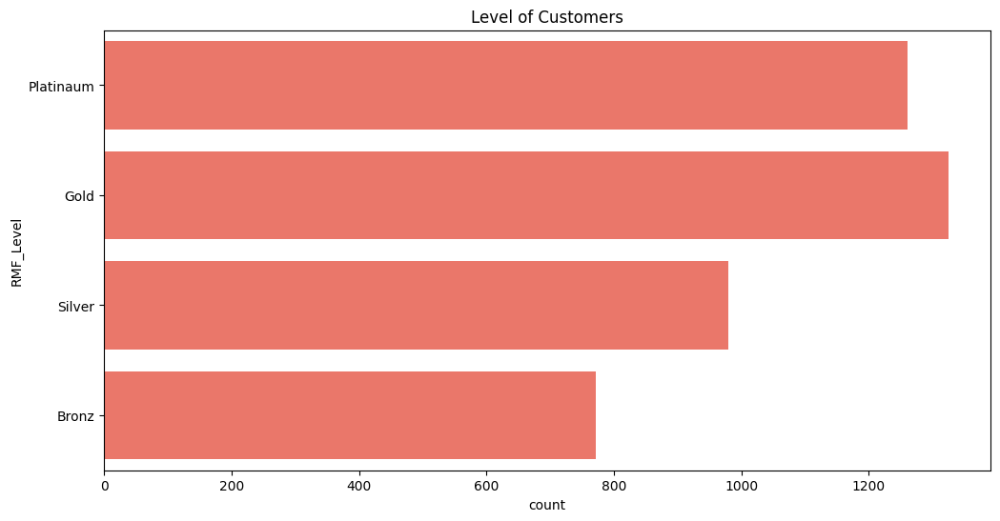

In [ ]:
# Plot The differet level of customers

plt.figure(figsize=(12,6))
sns.countplot(rmf_segmentation['RMF_Level'],color = '#f65f')
plt.title('Level of Customers')
plt.show()

In [ ]:
# Following table contains our targets peoples
rmf_segmentation[rmf_segmentation['RMF_Level']== 'Platinaum'].sort_values('Monetary', ascending = False).reset_index().head(10)

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level
0,14646.0,2,2076,280206.02,1,1,1,111,3,Platinaum
1,18102.0,1,431,259657.30,1,1,1,111,3,Platinaum
2,17450.0,9,336,194390.79,1,1,1,111,3,Platinaum
3,14911.0,2,5670,143711.17,1,1,1,111,3,Platinaum
4,12415.0,25,714,124914.53,2,1,1,211,4,Platinaum
5,14156.0,10,1395,117210.08,1,1,1,111,3,Platinaum
6,17511.0,3,963,91062.38,1,1,1,111,3,Platinaum
7,16029.0,39,241,80850.84,2,1,1,211,4,Platinaum
8,16684.0,5,277,66653.56,1,1,1,111,3,Platinaum
9,14096.0,5,5111,65164.79,1,1,1,111,3,Platinaum


In [ ]:
segmentation_based_on_rmf = rmf_segmentation[['Recency', 'Frequency', 'Monetary', 'RMF_Level']]

In [ ]:
segmentation_based_on_rmf.groupby('RMF_Level').agg({
    'Recency': ['mean', 'min', 'max'],
    'Frequency': ['mean', 'min', 'max'],
    'Monetary': ['mean', 'min', 'max', 'count']
})

Recency            Frequency               Monetary          \
                 mean min  max        mean min   max         mean     min   
RMF_Level                                                                   
Platinaum   20.550357   1  141  225.884219  20  7676  5253.556788  316.25   
Gold        64.433962   1  373   57.012075   1   521  1162.987662  114.34   
Silver     126.178571   2  374   24.337755   1    98   579.452461    6.90   
Bronz      218.585492  52  374   10.958549   1    39   199.030725    3.75   

                            
                 max count  
RMF_Level                   
Platinaum  280206.02  1261  
Gold       168472.50  1325  
Silver      77183.60   980  
Bronz         660.00   772

In [ ]:
# Handel the neagtive and zero values so as to handel infinite numbers during log transformation

def handel_neg_zero(num):
  if num <=0:
    return 1
  else:
    return num
#Apply handel_neg_zero function to Recency and Monetary columns

rmf_segmentation['Recency'] = [handel_neg_zero(x) for x in rmf_segmentation.Recency]
rmf_segmentation['Monetary'] = [handel_neg_zero(x) for x in rmf_segmentation.Monetary]


In [ ]:
# Perfrom Log tranformation to bring data into normal distribution

Log_rmf_df = rmf_segmentation[['Recency', 'Frequency', 'Monetary']].apply(np.log, axis = 1).round(3)

**Now Let's Visualize the Distribution of Recency, Frequency and Monetary.**

Text(0.5, 1.0, 'Distribution of Recency')

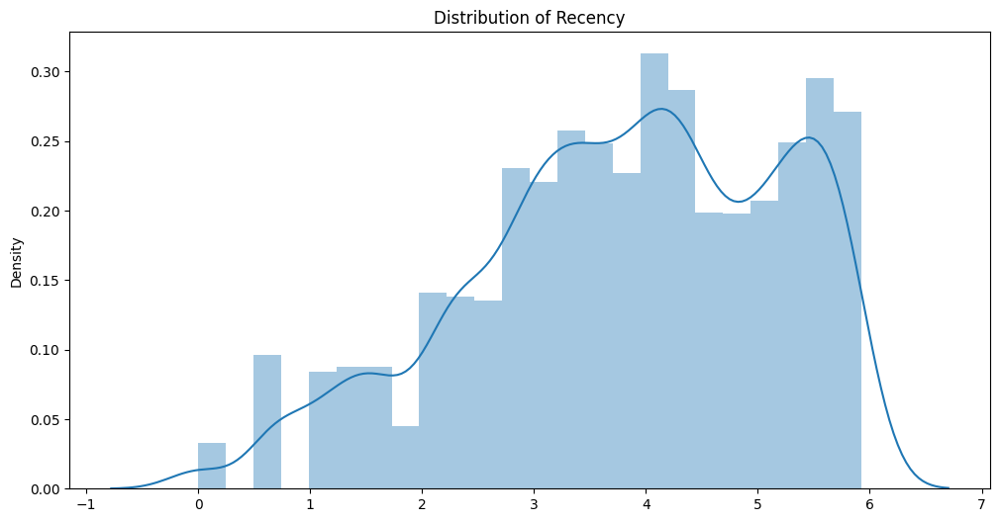

In [ ]:
# Recency distribution plot

plt.figure(figsize=(12,6))
sns.distplot(x=Log_rmf_df['Recency'])
plt.title('Distribution of Recency')

Text(0.5, 1.0, 'Distribution of Frequency')

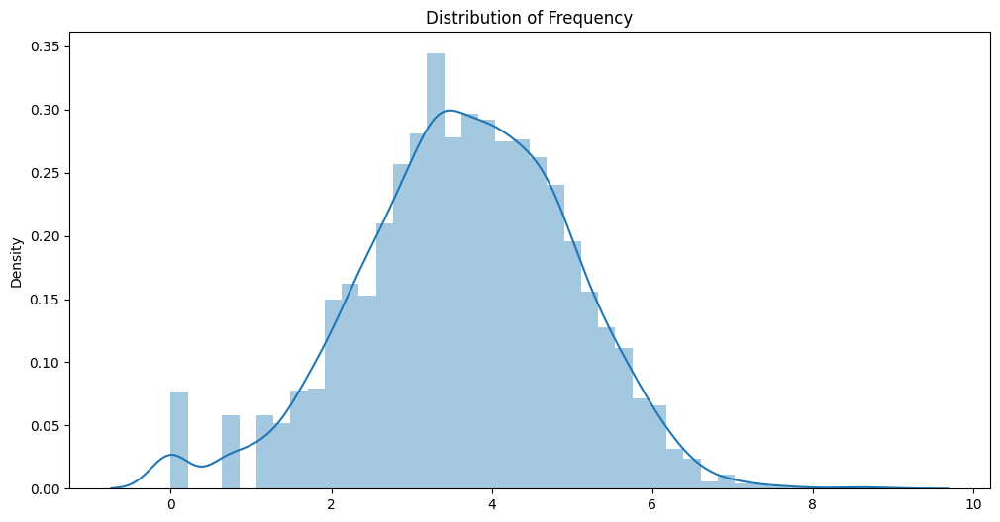

In [ ]:
# Frequency Distribution plot

plt.figure(figsize=(12,6))
sns.distplot(x=Log_rmf_df['Frequency'])
plt.title('Distribution of Frequency')

Text(0.5, 1.0, 'Distribution of Monetary')

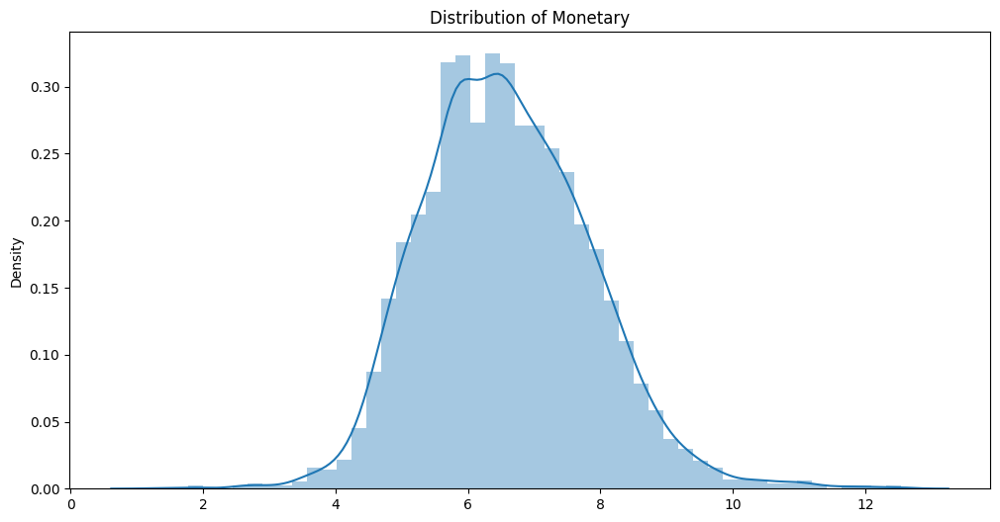

In [ ]:
# Monetary Distribution plot

plt.figure(figsize=(12,6))
sns.distplot(x=Log_rmf_df['Monetary'])
plt.title('Distribution of Monetary')

In [ ]:
# importing the math library

import math
rmf_segmentation['Recency_log'] = rmf_segmentation['Recency'].apply(math.log)
rmf_segmentation['Frequency_log'] = rmf_segmentation['Frequency'].apply(math.log)
rmf_segmentation['Monetary_log'] = rmf_segmentation['Monetary'].apply(math.log)

In [ ]:
rmf_segmentation

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level,Recency_log,Frequency_log,Monetary_log
CustomerID,,,,,,,,,,,,
12346.0,326,1,77183.60,4,4,1,441,9,Silver,5.786897,0.000000,11.253942
12347.0,3,182,4310.00,1,1,1,111,3,Platinaum,1.098612,5.204007,8.368693
12348.0,76,31,1797.24,3,3,1,331,7,Gold,4.330733,3.433987,7.494007
12349.0,19,73,1757.55,2,2,1,221,5,Platinaum,2.944439,4.290459,7.471676
12350.0,311,17,334.40,4,4,3,443,11,Bronz,5.739793,2.833213,5.812338
...,...,...,...,...,...,...,...,...,...,...,...,...
18280.0,278,10,180.60,4,4,4,444,12,Bronz,5.627621,2.302585,5.196285
18281.0,181,7,80.82,4,4,4,444,12,Bronz,5.198497,1.945910,4.392224
18282.0,8,12,178.05,1,4,4,144,9,Silver,2.079442,2.484907,5.182064


In [ ]:
#importing Libraries

from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler


In [ ]:
!pip install yellowbrick

####**Before implementing the Kmeans Clustering algorithm we need to decide the number of clusters to put inside algorithm as input. So we will be finding the minimum number of clusters required by using Elbow method.**

##**-----------Recency and Monetary----------**

## ***KMeans Clustering***

##Applying Elbow Method on Recency and Monetary.

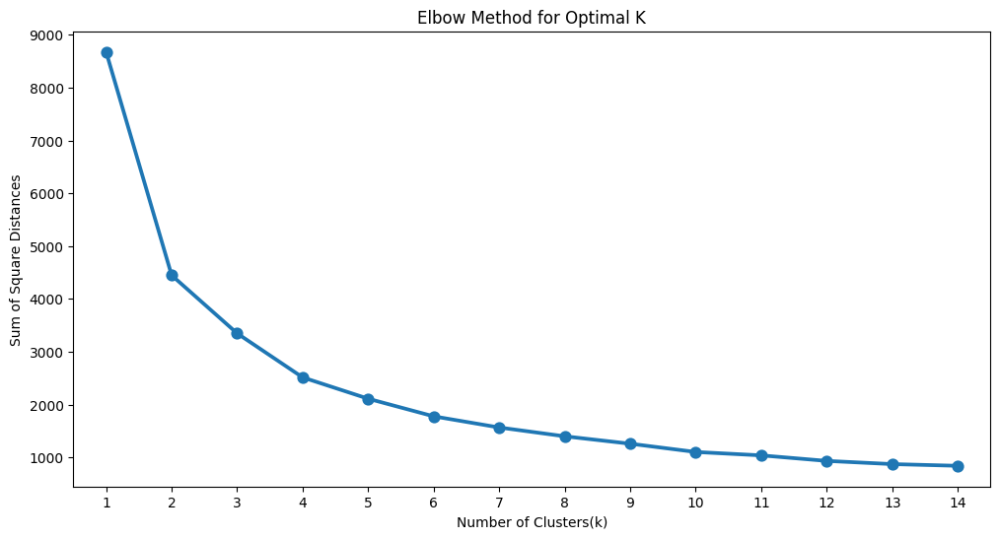

In [ ]:
# Taking Recency_log and Monetary_log in list

Recency_and_Monetary_feat = ['Recency_log', 'Monetary_log']

# Taking only Values of recency and monetary in X.
X = rmf_segmentation[Recency_and_Monetary_feat].values

# standardising the data
scaler = StandardScaler()
X=scaler.fit_transform(X)

# Applying Elbow Method
wcss = {}
for k in range(1, 15):
  km = KMeans(n_clusters=k, init= 'k-means++', max_iter= 1000)
  km = km.fit(X)
  labels = km.labels_                     # capture the cluster lables
  centroids = km.cluster_centers_
  wcss[k] = km.inertia_

#Plot the graph for the sum of quare distance values and Number of Clusters
plt.figure(figsize=(12, 6))
sns.pointplot(x = list(wcss.keys()), y= list(wcss.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method for Optimal K')
plt.show()

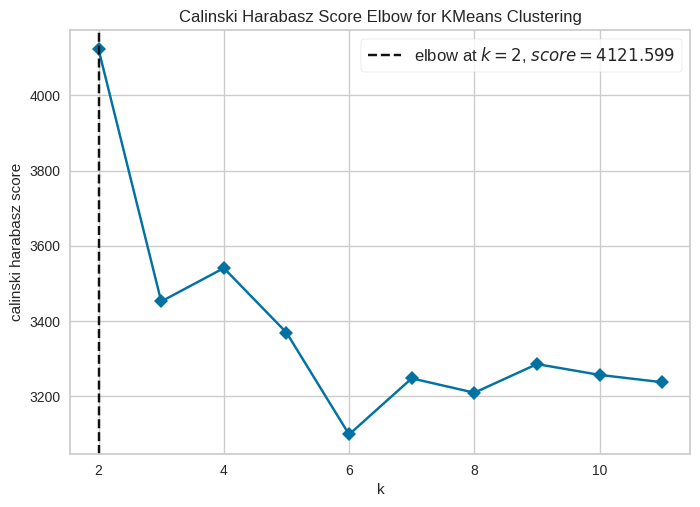

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(
    model, k=(2,12), metric='calinski_harabasz', timings=False
)
visualizer.fit(X)  # Fit the data to the visualizer
visualizer.show()  # Finalize and render the figure


## Silhoutte Score (Validating Above optimal cluster values(i.e optimal_cluster = 2))

In [ ]:
# Taking Recency_log and Monetary_log in list.
Recency_and_Monetary_feat = ['Recency_log', 'Monetary_log']
# Taking only values of recency and monetary in X
X = rmf_segmentation[Recency_and_Monetary_feat]

# standardising the data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Silhouette Score
range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]
for n_clusters in range_n_clusters:
  clusters = KMeans(n_clusters=n_clusters, random_state=1)
  preds = clusters.fit_predict(X)
  centers = clusters.cluster_centers_

  score = silhouette_score(X, preds)
  print('For n_clusters ={}, Silhouette score is {}'.format(n_clusters, score))

For n_clusters =2, Silhouette score is 0.41934373830635724
For n_clusters =3, Silhouette score is 0.3392380930426041
For n_clusters =4, Silhouette score is 0.36303398366610573
For n_clusters =5, Silhouette score is 0.3323136525490277
For n_clusters =6, Silhouette score is 0.3415102783355785
For n_clusters =7, Silhouette score is 0.3348545700805176
For n_clusters =8, Silhouette score is 0.3287405386129524
For n_clusters =9, Silhouette score is 0.3362220055816291
For n_clusters =10, Silhouette score is 0.3433193166950797
For n_clusters =11, Silhouette score is 0.33570506753848434
For n_clusters =12, Silhouette score is 0.3398793847216828
For n_clusters =13, Silhouette score is 0.33674018172759024
For n_clusters =14, Silhouette score is 0.3212070290195505
For n_clusters =15, Silhouette score is 0.3325086174544981


For n_clusters = 2 The average silhouette_score is : 0.41937797416217915


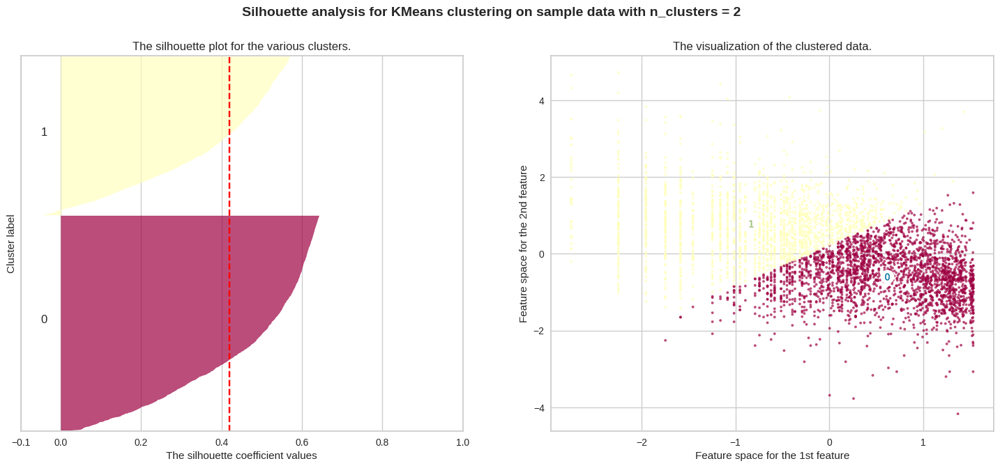

For n_clusters = 3 The average silhouette_score is : 0.34055667540263146


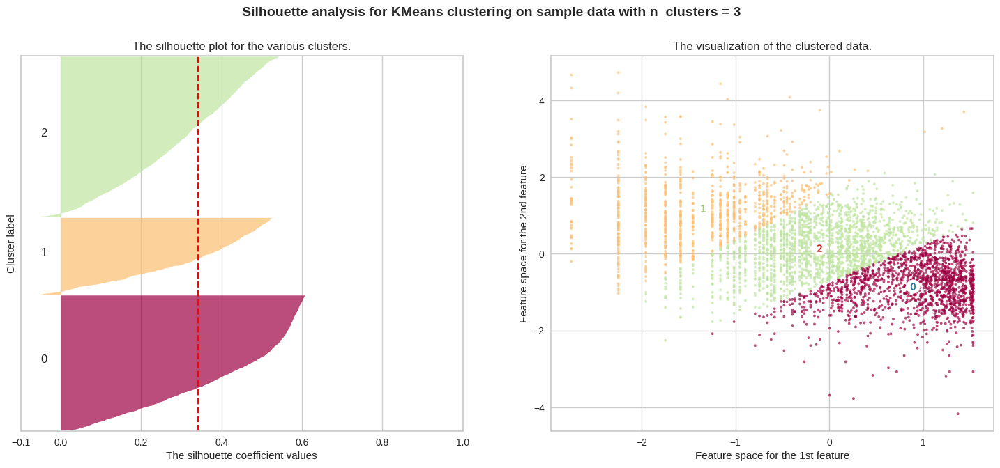

For n_clusters = 4 The average silhouette_score is : 0.3641181193306178


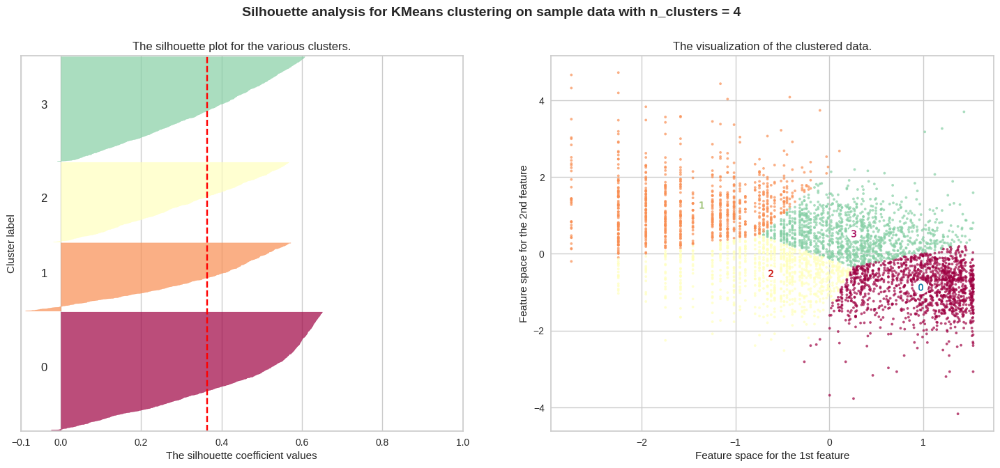

For n_clusters = 5 The average silhouette_score is : 0.35483486272346465


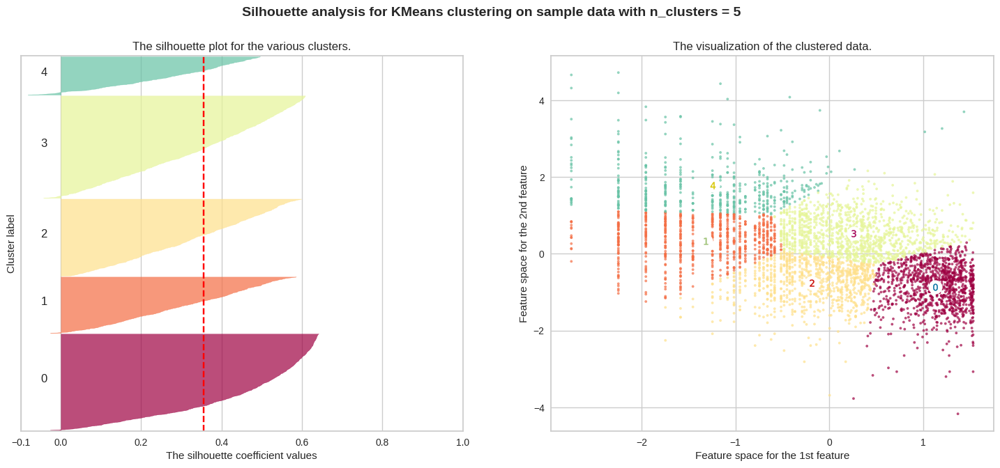

For n_clusters = 6 The average silhouette_score is : 0.3415689559465411


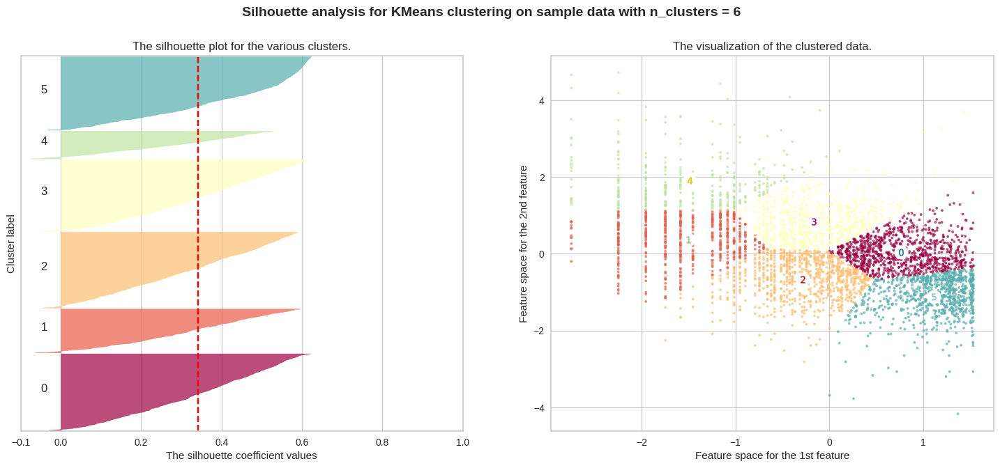

For n_clusters = 7 The average silhouette_score is : 0.3407067279412151


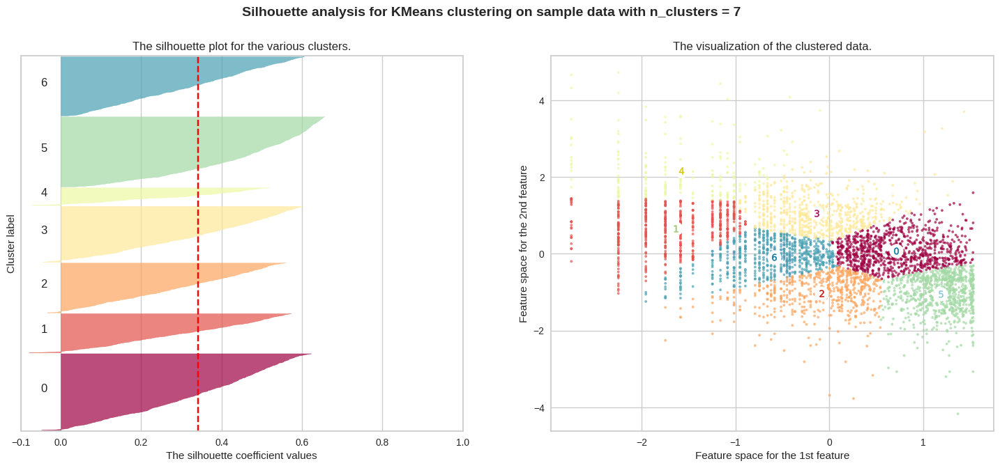

For n_clusters = 8 The average silhouette_score is : 0.32718314282486444


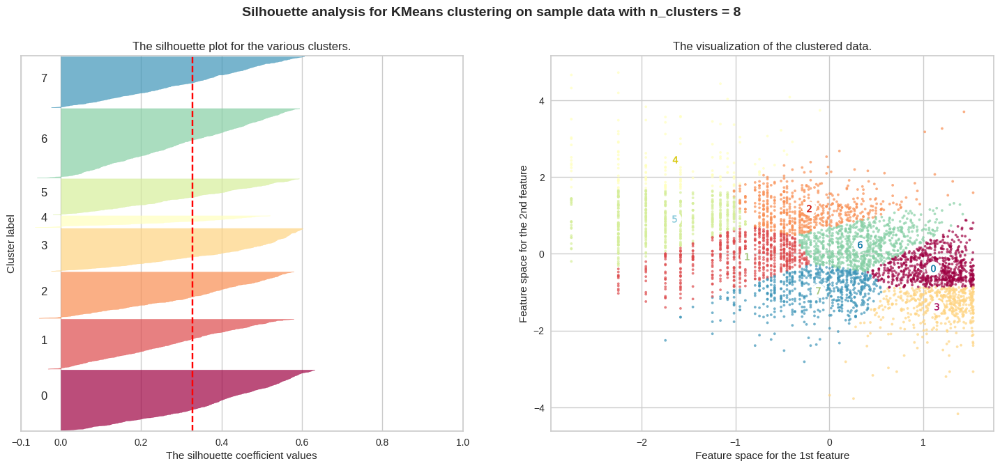

For n_clusters = 9 The average silhouette_score is : 0.3442733044846937


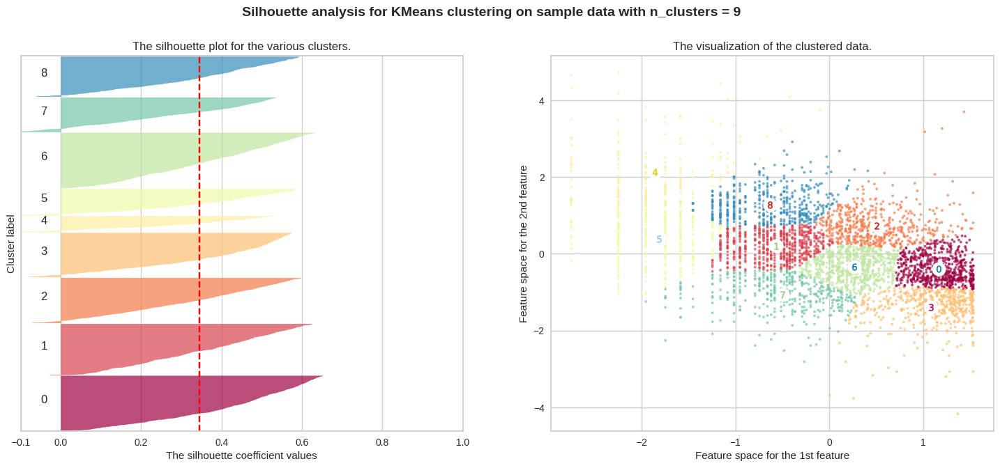

For n_clusters = 10 The average silhouette_score is : 0.34363952103208945


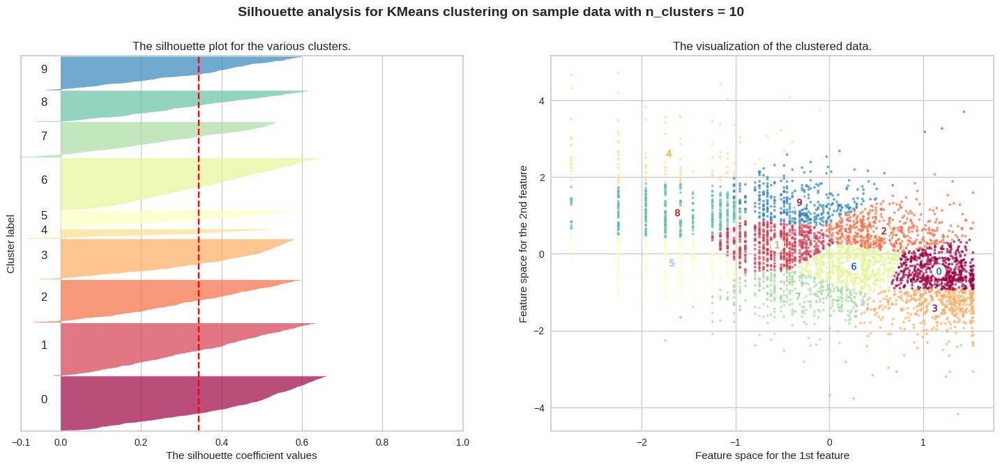

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


range_n_clusters = [2,3,4,5,6,7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,init='k-means++',random_state=0)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.Spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()

###**Observation**
We got good Silhouette plot for Cluster-2 and Cluster-3 but still few datapoints are on the negative side of the Silhouette Coefficient values as shown in below figure. But The Cluster-2 is better than others.

###**So giving n_cluster=2 on KMeans Model**

In [ ]:
# Applyig kmeans_clustering algorithm
kmeans_rec_mon = KMeans(n_clusters= 2)
kmeans_rec_mon.fit(X)
y_kmeans = kmeans_rec_mon.predict(X)

In [ ]:
# Find the clusters for the observation given in the dataset

rmf_segmentation['Cluster_based_rec_mon'] = kmeans_rec_mon.labels_
rmf_segmentation.head(10)

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level,Recency_log,Frequency_log,Monetary_log,Cluster_based_rec_mon
CustomerID,,,,,,,,,,,,,
12346.0,326,1,77183.60,4,4,1,441,9,Silver,5.786897,0.000000,11.253942,0
12347.0,3,182,4310.00,1,1,1,111,3,Platinaum,1.098612,5.204007,8.368693,0
12348.0,76,31,1797.24,3,3,1,331,7,Gold,4.330733,3.433987,7.494007,0
12349.0,19,73,1757.55,2,2,1,221,5,Platinaum,2.944439,4.290459,7.471676,0
12350.0,311,17,334.40,4,4,3,443,11,Bronz,5.739793,2.833213,5.812338,1
12352.0,37,85,2506.04,2,2,1,221,5,Platinaum,3.610918,4.442651,7.826459,0
12353.0,205,4,89.00,4,4,4,444,12,Bronz,5.323010,1.386294,4.488636,1
12354.0,233,58,1079.40,4,2,2,422,8,Gold,5.451038,4.060443,6.984161,1
12355.0,215,13,459.40,4,4,3,443,11,Bronz,5.370638,2.564949,6.129921,1


In [ ]:
# Centers of the Clusters(coordinates)
centers = kmeans_rec_mon.cluster_centers_
centers


array([[-0.82955227,  0.79296041],
       [ 0.61392858, -0.58684796]])

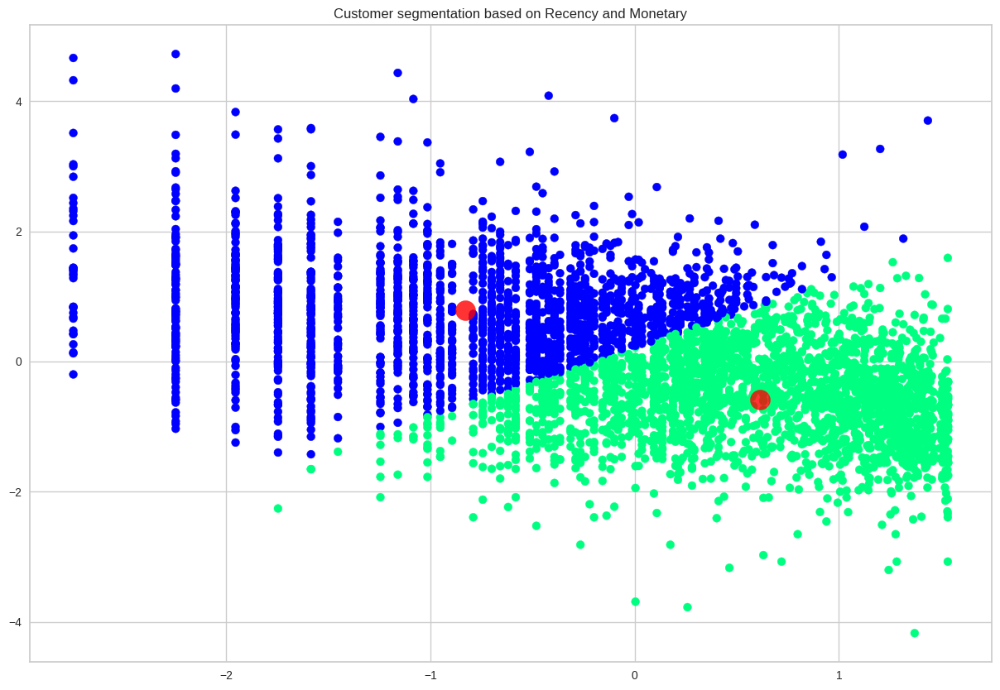

In [ ]:
# Ploting visualizing the clusters
plt.figure(figsize=(15,10))
plt.title('Customer segmentation based on Recency and Monetary')
plt.scatter(X[:, 0], X[:, 1], c = y_kmeans, s= 50, cmap='winter')

centers = kmeans_rec_mon.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c= 'red', s= 300, alpha = 0.8)

## **DBSCAN Implementation**

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn import metrics


In [ ]:
# Eps values is the radius value for the datapoint from which circle is draw and min sample indicate how many datapoints shpild
# be consider tto consider that point in cluster

db = DBSCAN(eps=0.3, min_samples=10).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Numnber of Clusters in labels, ignoring noise if present
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters)
print('Estimated number of noise points: %d' % n_noise_)
print('Silhouette Coefficient: %0.3f' % metrics.silhouette_score(X, labels))


Estimated number of clusters: 1
Estimated number of noise points: 105
Silhouette Coefficient: 0.487


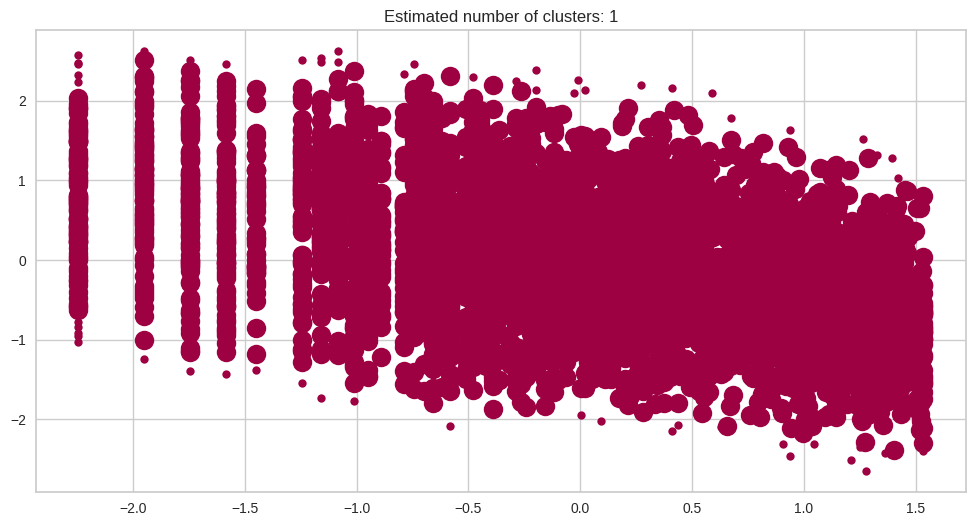

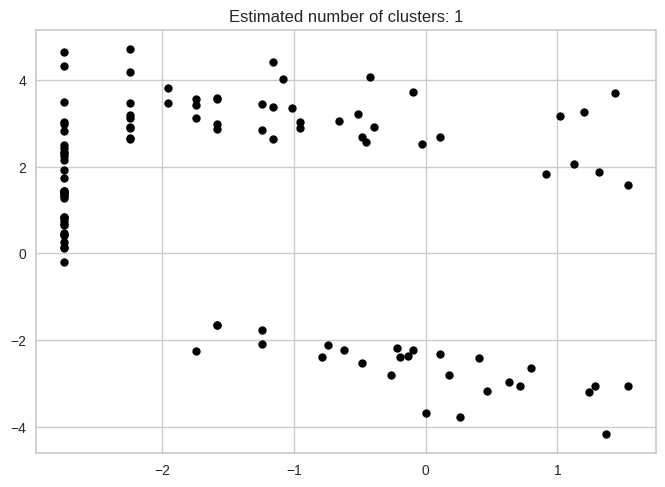

In [ ]:
# Black removed and is used for noise instead

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
plt.figure(figsize=(12, 6))
for k, col in zip(unique_labels, colors):
  if k == -1:
    # Black used for noise
    col = [0, 0, 0, 1]

  class_member_mask = labels == k

  xy = X[class_member_mask & core_samples_mask]
  plt.plot(
      xy[:, 0],
      xy[:, 1],
      'o', markerfacecolor = tuple(col),
      markeredgecolor='k', markersize = 14
  )
  xy = X[class_member_mask & ~core_samples_mask]
  plt.plot(
      xy[:, 0],
      xy[:, 1],
      'o', markerfacecolor = tuple(col),
      markeredgecolor = 'k', markersize = 6
  )
  plt.title('Estimated number of clusters: %d' % n_clusters)
  plt.show()

## **---------Frequency and Monetary ----------**

### KMeans Clustering

### 1) Applying Elbow Method on Frequency and Monetary.

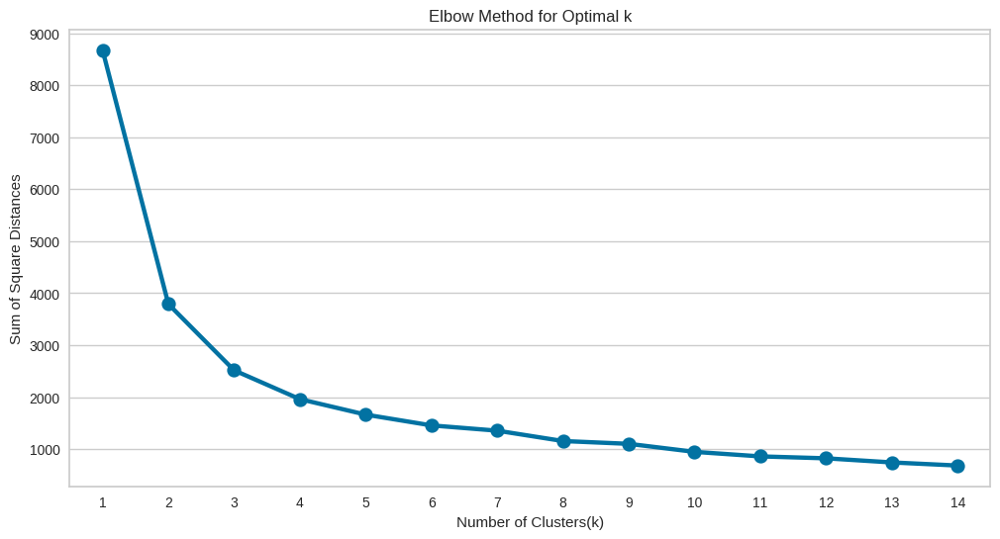

In [ ]:
# Taking Frequency and Monetary_log in list

Frequency_and_Monetary_feat = ['Frequency_log', 'Monetary_log']

# Taking only values of Frequency and monetary in X
X = rmf_segmentation[Frequency_and_Monetary_feat].values

# standardising the data
scaler = StandardScaler()
X = scaler.fit_transform(X)

#Applying the Elbow Method
wcss = {}
for k in range(1, 15):
  km = KMeans(n_clusters = k, init = 'k-means++', max_iter = 1000)
  km = km.fit(X)
  wcss[k] = km.inertia_

# Plot the graph for the sum of Square distance values and number of Clusters
plt.figure(figsize= (12, 6))
sns.pointplot(x = list(wcss.keys()), y = list(wcss.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method for Optimal k')
plt.show()

**Here we can see the Optimal value for cluster came out to be 2.**

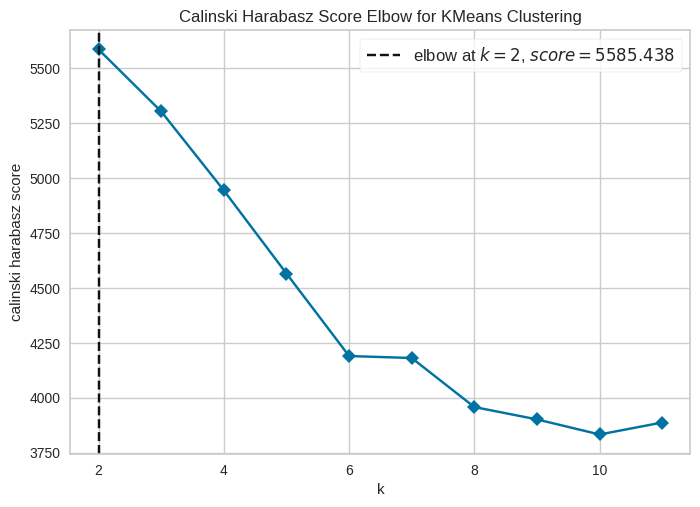

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from yellowbrick.cluster import KElbowVisualizer

# Instatiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(
    model, k =(2, 12), metric = 'calinski_harabasz', timings =False
)
visualizer.fit(X)
visualizer.show()

**Elbow visualizer also giving clisters = 2.**

In [ ]:
# Taking Recency_log and Monetary_log in list.
Frequency_and_Monetary_feat = ['Frequency_log', 'Monetary_log']
# Taking only values of recency and monetary in X
X = rmf_segmentation[Frequency_and_Monetary_feat].values

# standardising the data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Silhouette Score
range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]
for n_clusters in range_n_clusters:
  clusters = KMeans(n_clusters=n_clusters, random_state=1)
  preds = clusters.fit_predict(X)
  centers = clusters.cluster_centers_

  score = silhouette_score(X, preds)
  print('For n_clusters ={}, Silhouette score is {}'.format(n_clusters, score))

For n_clusters =2, Silhouette score is 0.4786618125325248
For n_clusters =3, Silhouette score is 0.4074806582480207
For n_clusters =4, Silhouette score is 0.37251013550402795
For n_clusters =5, Silhouette score is 0.3467394021038058
For n_clusters =6, Silhouette score is 0.3188708074889626
For n_clusters =7, Silhouette score is 0.3363113081488424
For n_clusters =8, Silhouette score is 0.32853940016660377
For n_clusters =9, Silhouette score is 0.34542559650561927
For n_clusters =10, Silhouette score is 0.3597082029266194
For n_clusters =11, Silhouette score is 0.3399658238873783
For n_clusters =12, Silhouette score is 0.3483498056720304
For n_clusters =13, Silhouette score is 0.35846022188888493
For n_clusters =14, Silhouette score is 0.34416153985611686
For n_clusters =15, Silhouette score is 0.34384407511288423


**Here we can Observe that for the cluster = 2 silhouette score is good as compared to others.(if values is close to 1 means data points are clustered very well respective clusters and distance of that dispoint is very far from other cluster.)**

For n_clusters = 2 The average silhouette_score is : 0.4786618125325248


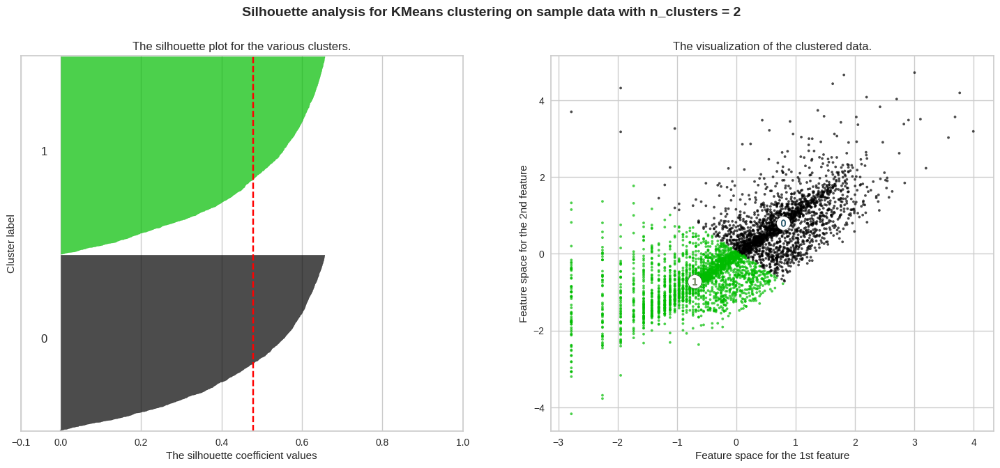

For n_clusters = 3 The average silhouette_score is : 0.4074806582480207


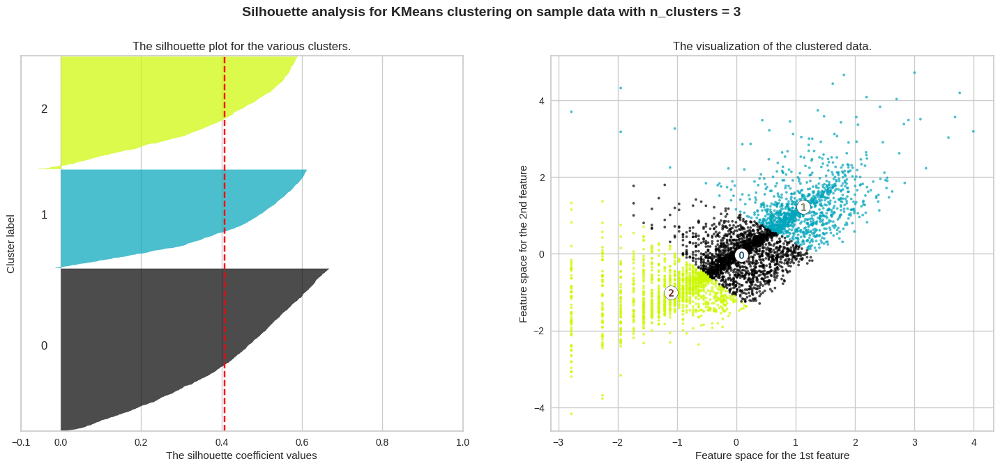

For n_clusters = 4 The average silhouette_score is : 0.37251013550402795


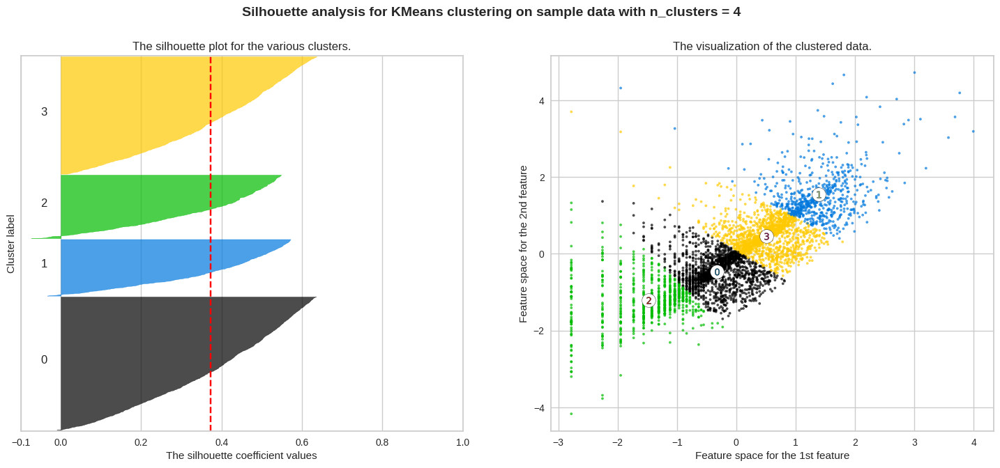

For n_clusters = 5 The average silhouette_score is : 0.3467394021038058


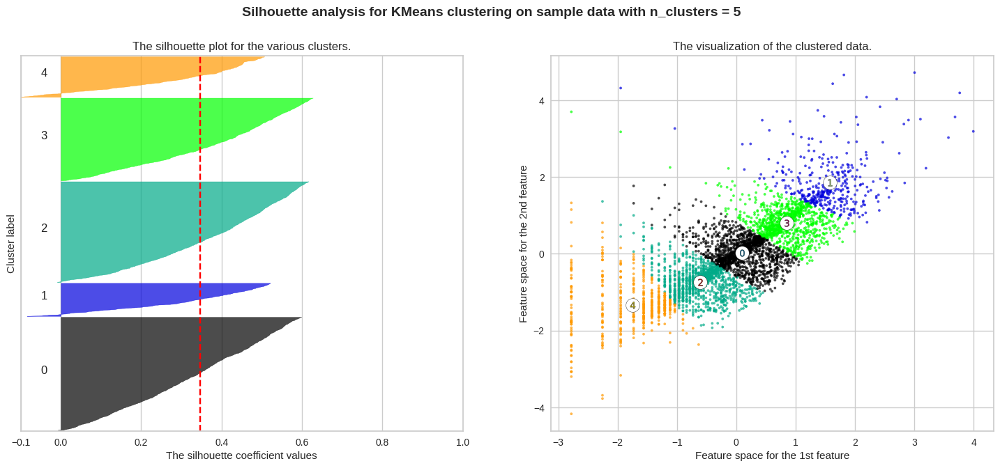

For n_clusters = 6 The average silhouette_score is : 0.3188708074889626


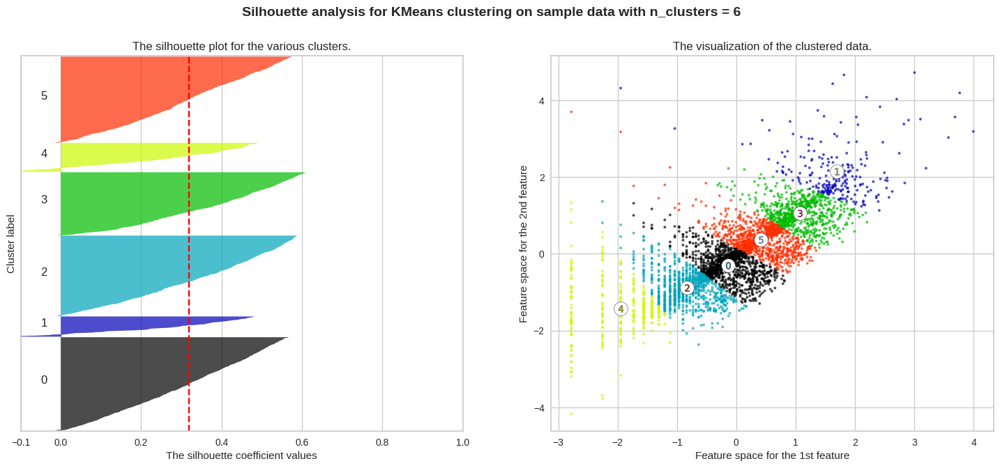

For n_clusters = 7 The average silhouette_score is : 0.3363113081488424


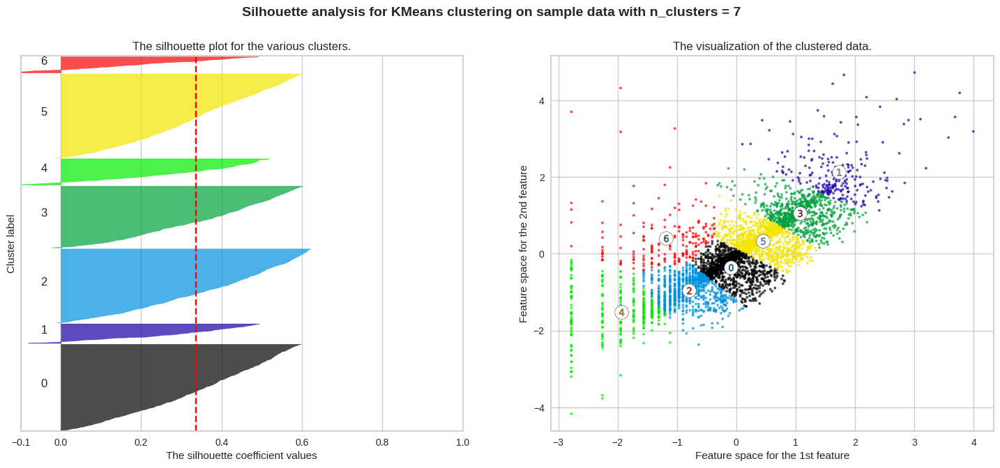

For n_clusters = 8 The average silhouette_score is : 0.32853940016660377


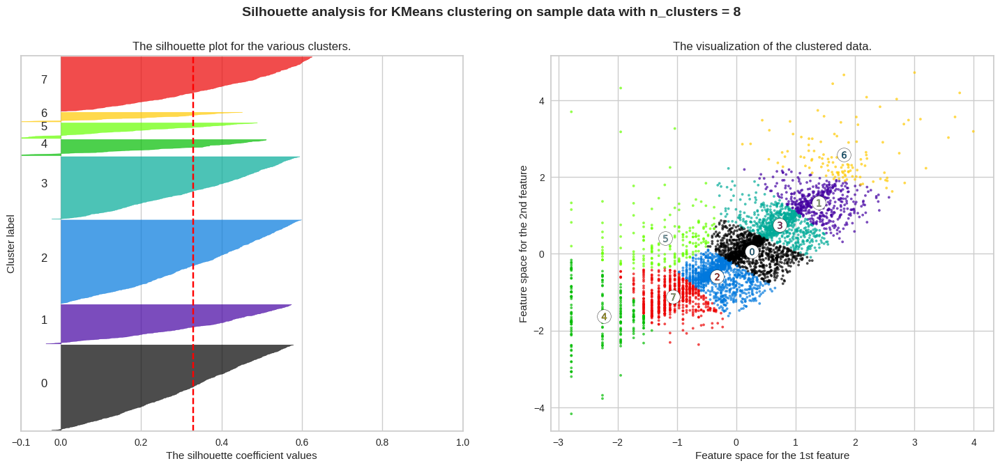

For n_clusters = 9 The average silhouette_score is : 0.34542559650561927


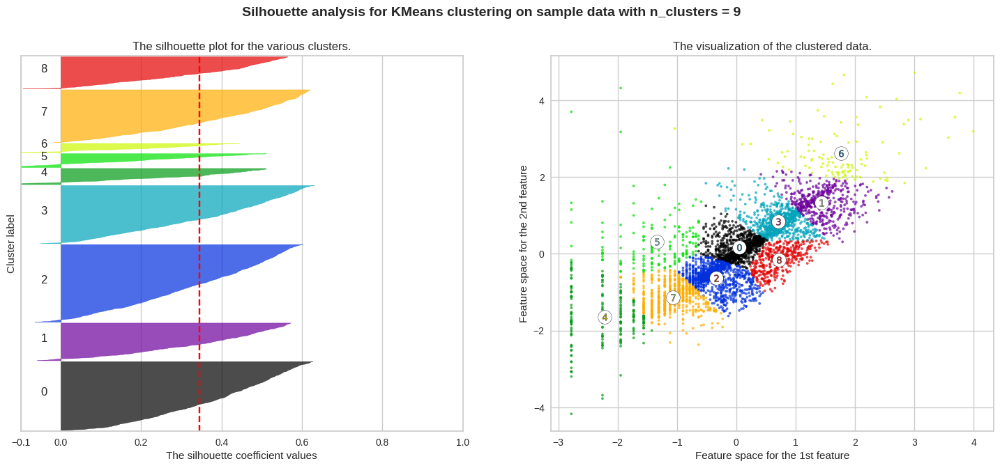

For n_clusters = 10 The average silhouette_score is : 0.3597082029266194


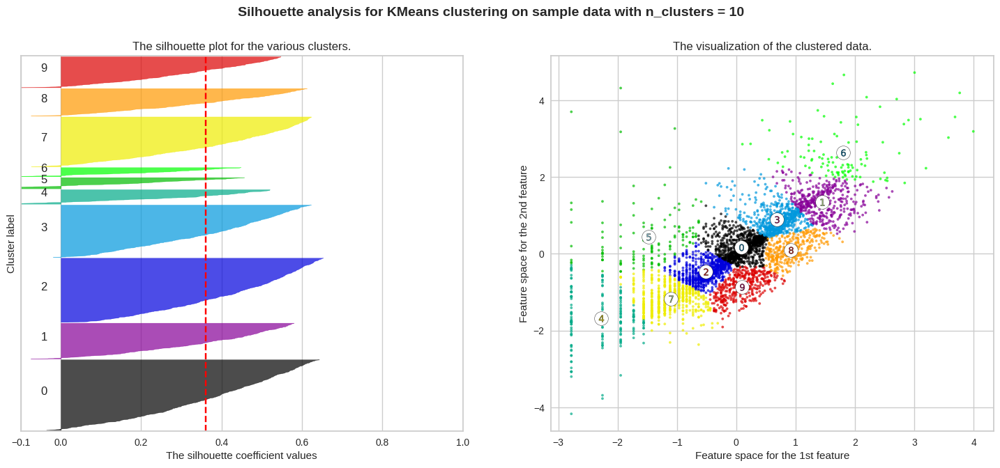

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


range_n_clusters = [2,3,4,5,6,7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,init='k-means++',random_state=1)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_

    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200, edgecolor ='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor ='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()

### So giving n_clusters = 2 on Kmeans Model.

In [ ]:
# Applting Kmeans_clustering algorithm
kmeans_freq_mon = KMeans(n_clusters=2)
kmeans_freq_mon.fit(X)
y_means = kmeans_freq_mon.predict(X)

In [ ]:
# Find the clusters for the observation given in the dataset

rmf_segmentation['Cluster_based_freq_mon'] = kmeans_freq_mon.labels_
rmf_segmentation.head(10)

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level,Recency_log,Frequency_log,Monetary_log,Cluster_based_rec_mon,Cluster_based_freq_mon
CustomerID,,,,,,,,,,,,,,
12346.0,326,1,77183.60,4,4,1,441,9,Silver,5.786897,0.000000,11.253942,0,0
12347.0,3,182,4310.00,1,1,1,111,3,Platinaum,1.098612,5.204007,8.368693,0,0
12348.0,76,31,1797.24,3,3,1,331,7,Gold,4.330733,3.433987,7.494007,0,0
12349.0,19,73,1757.55,2,2,1,221,5,Platinaum,2.944439,4.290459,7.471676,0,0
12350.0,311,17,334.40,4,4,3,443,11,Bronz,5.739793,2.833213,5.812338,1,1
12352.0,37,85,2506.04,2,2,1,221,5,Platinaum,3.610918,4.442651,7.826459,0,0
12353.0,205,4,89.00,4,4,4,444,12,Bronz,5.323010,1.386294,4.488636,1,1
12354.0,233,58,1079.40,4,2,2,422,8,Gold,5.451038,4.060443,6.984161,1,0
12355.0,215,13,459.40,4,4,3,443,11,Bronz,5.370638,2.564949,6.129921,1,1


In [ ]:
# Centers of the clusters(coordiantes)

centers = kmeans_freq_mon.cluster_centers_
centers

array([[ 0.79137344,  0.79981225],
       [-0.70382603, -0.71133128]])

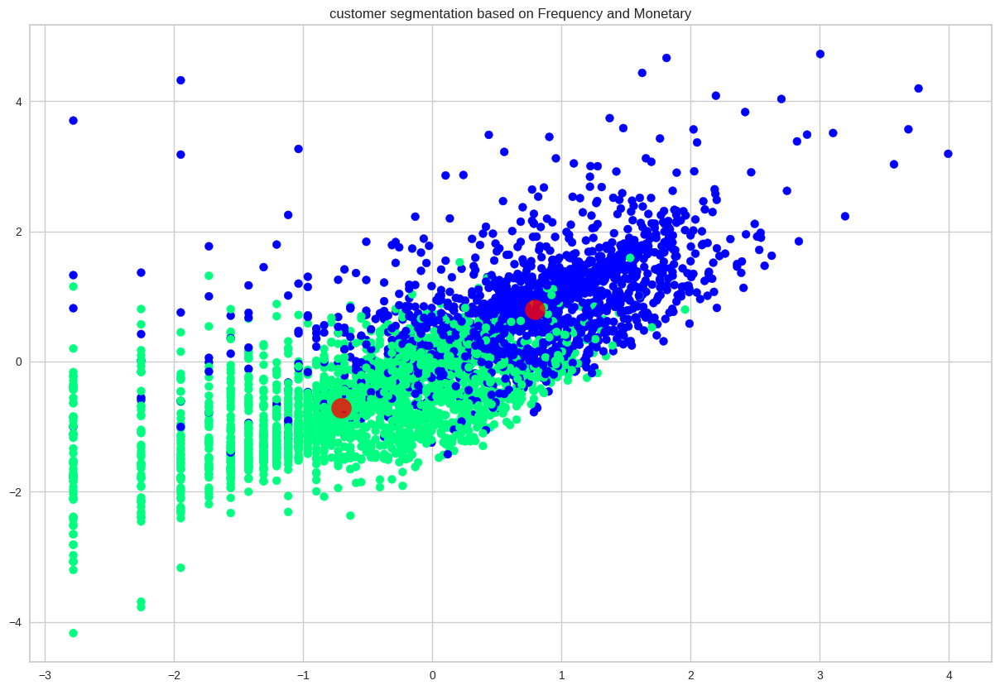

In [ ]:
# Plotting visualizing the cluster
plt.figure(figsize = (15, 10))
plt.title('customer segmentation based on Frequency and Monetary')
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s = 50, cmap='winter')

centers =kmeans_freq_mon.cluster_centers_
plt.scatter(centers[:,0], centers[:,1], c ='red', s = 300, alpha=0.8)

### **DBSCAN Algorithm**

In [ ]:
# Esp value is the radius value for the datapoint from which circle is drawn and
# min sample indicates how many datapoints should be consider to consider that point in cluster
# codesource(sklearn documentation)

db = DBSCAN(eps=0.5, min_samples = 15).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] =True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of cluster: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print('Silhouette Coeeficient: %0.3f' % metrics.silhouette_score(X, labels))

Estimated number of cluster: 2
Estimated number of noise points: 47
Silhouette Coeeficient: 0.427


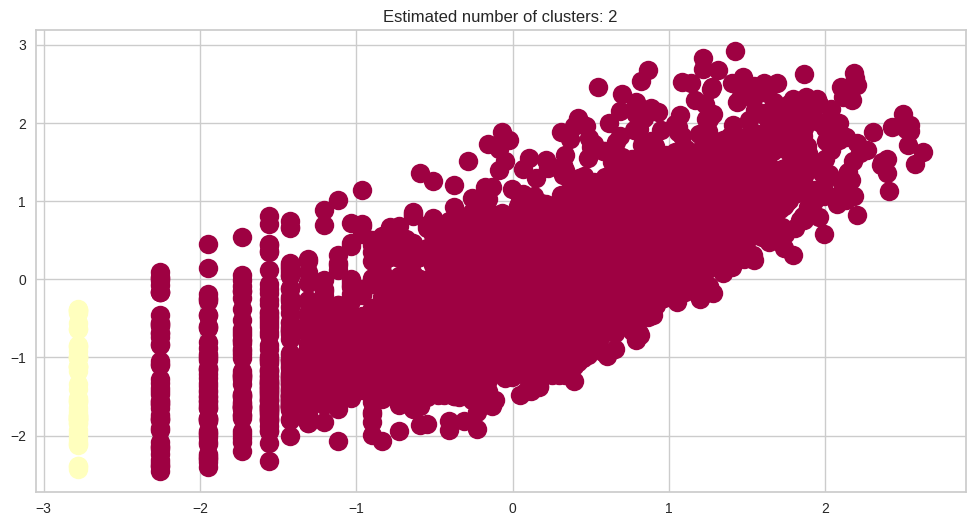

In [ ]:
# Black removed and is used for noise instead
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
plt.figure(figsize=(12, 6))
for k, col in zip(unique_labels, colors):
  if k == -1:
    # black used for noise.
    col = [0, 0, 0, 1]

  class_member_mask = labels == k

  xy = X[class_member_mask & core_samples_mask]
  plt.plot(
      xy[:, 0],
      xy[:, 1],
      'o',
      markerfacecolor = tuple(col),
      markeredgecolor = 'k',
      markersize=14
  )

  zy = X[class_member_mask & ~core_samples_mask]
  plt.plot(
      xy[:, 0],
      xy[:, 1],
      'o',
      markerfacecolor = tuple(col),
      markeredgecolor='k',
      markersize =6
  )
  plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

## **---------------Recency, Frequency and Monetary ----------------**

### **KMenas Clustering**

Before implementing the Kmeans Clustering algorithm we need to decide the number of clusters to put inside algorithm as input.so we will be figure the minimum number of clusters required by using Elbow method.

### **Applying Elbow Method on Recency, Frequency and Monetary**

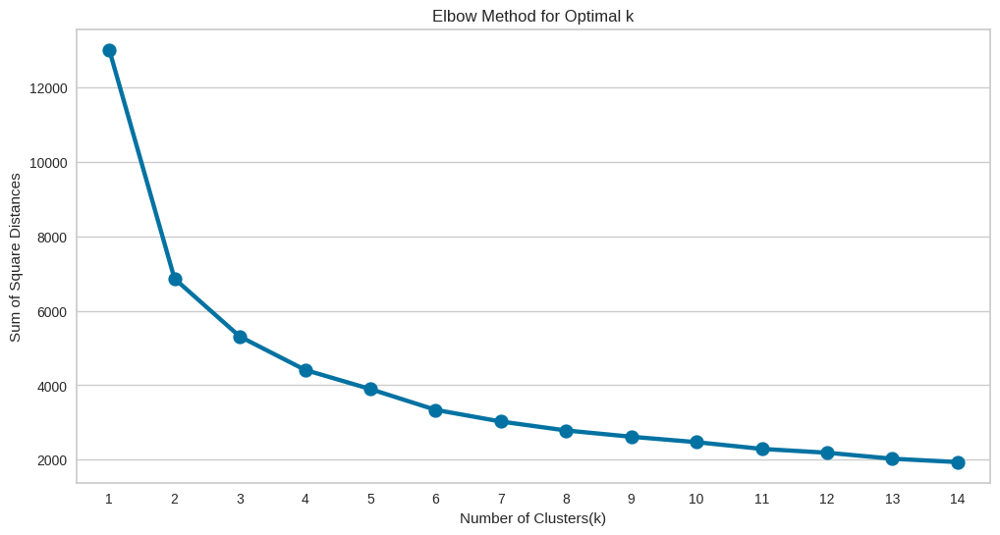

In [ ]:
# taking Recency_log, Frequency_log and Monetary_log in list.
Recency_and_Monetary_feat = ['Recency_log','Frequency_log', 'Monetary_log']

# taking only values of recency and monetary in X
X = rmf_segmentation[Recency_and_Monetary_feat].values

# standardising the data
scaler = StandardScaler()
X=scaler.fit_transform(X)

# applying Elbow Method
Wcss = {}
for k in range(1, 15):
  km = KMeans(n_clusters =k, init = 'k-means++', max_iter = 1000)
  km = km.fit(X)
  wcss[k] = km.inertia_

# Plot the graph for the sum of square distance values and Number of Clusters
plt.figure(figsize=(12, 6))
sns.pointplot(x = list(wcss.keys()), y = list(wcss.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method for Optimal k')
plt.show()

**Here we can see that Optimal value for cluster came out to be 2.**

### **Cross verifying with Elbow Visualizer**

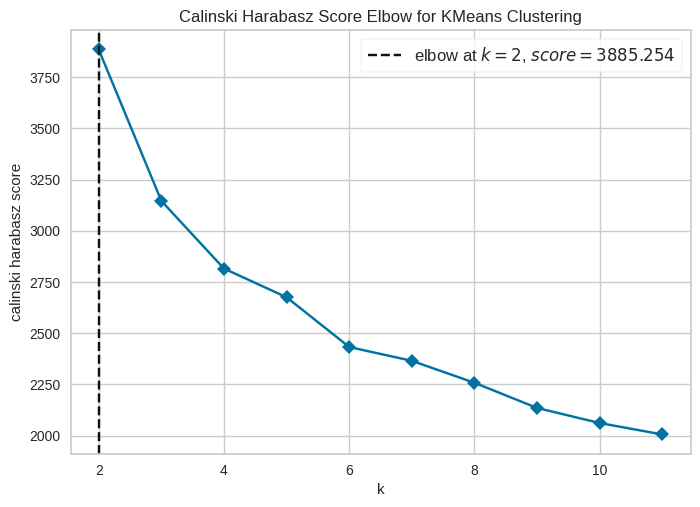

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(
    model, k = ( 2, 12), metric = 'calinski_harabasz', timings=False
)

visualizer.fit(X)
visualizer.show()

**Elbow Visualizer also gicing cluster = 2**

### **Silhouette Score(Validating Above optimal cluster value(i.e optimal_cluster=2))**

In [ ]:
# Taking Recency_log, Frequency_log and Monetary_log in list
Recency_and_Monetary_feat = ['Recency_log','Frequency_log','Monetary_log']

# taking only values of recency and monetary in X
X= rmf_segmentation[Recency_and_Monetary_feat].values

# Standardising the data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Silhouette Score
range_n_clusters = [ 2,3,4,5,6,7,8,9,10,11,12,13,14,15]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=1)
  preds = clusterer.fit_predict(X)
  centers = clusterer.cluster_centers_

  score = silhouette_score(X, preds)
  print('For n_clusters = {}, silhouette score is {}'.format(n_clusters, score))


For n_clusters = 2, silhouette score is 0.3952487047945368
For n_clusters = 3, silhouette score is 0.3018819797459025
For n_clusters = 4, silhouette score is 0.3036097758987389
For n_clusters = 5, silhouette score is 0.27910047312789915
For n_clusters = 6, silhouette score is 0.27603143591713325
For n_clusters = 7, silhouette score is 0.2655769199472786
For n_clusters = 8, silhouette score is 0.26140735071739707
For n_clusters = 9, silhouette score is 0.26035434709367405
For n_clusters = 10, silhouette score is 0.25318663842440575
For n_clusters = 11, silhouette score is 0.25412916282390674
For n_clusters = 12, silhouette score is 0.2536588119781874
For n_clusters = 13, silhouette score is 0.26249399499179893
For n_clusters = 14, silhouette score is 0.2577477659361873
For n_clusters = 15, silhouette score is 0.25526309921926865


Here we can observe that n_cluster =2 silhouette score is good as compared to others.(if values is close tp 1 means data points are clustered very well to respective clusters and distance of that datapoint is very far from the other cluster.)

For n_clusters = 2 The average silhouette_score is : 0.3952487047945368


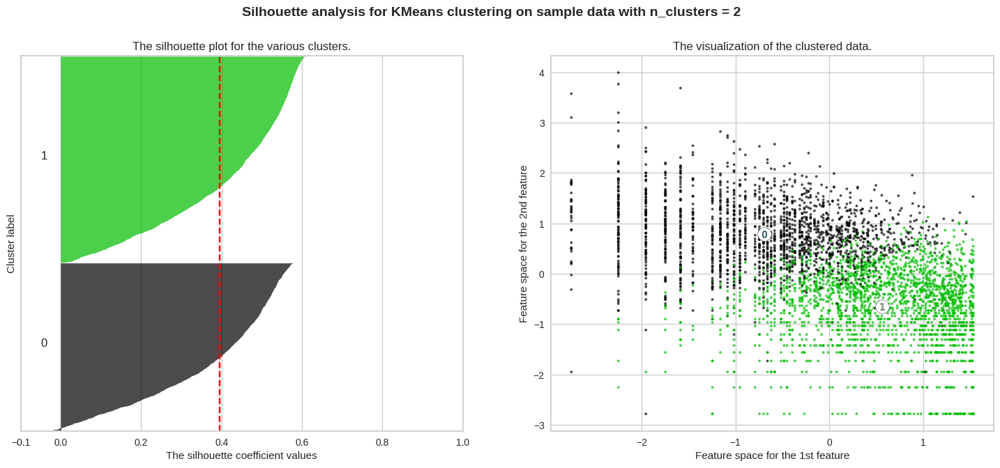

For n_clusters = 3 The average silhouette_score is : 0.3018819797459025


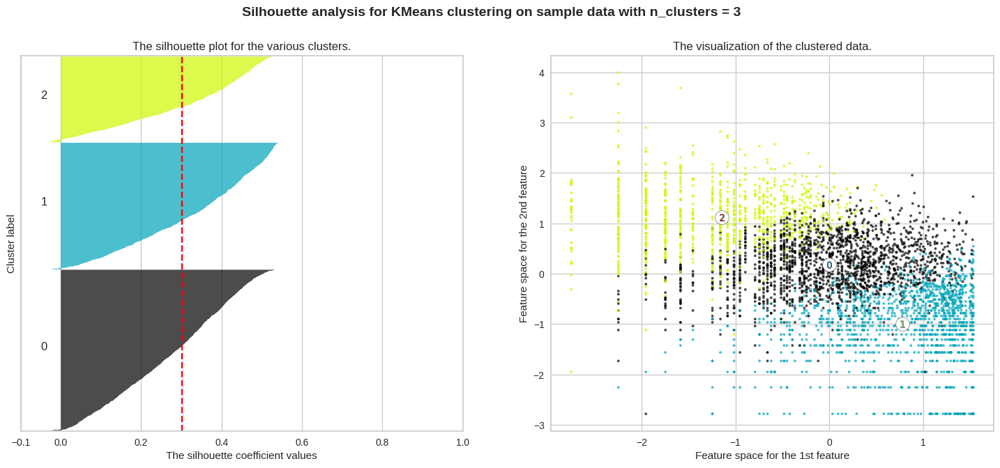

For n_clusters = 4 The average silhouette_score is : 0.3036097758987389


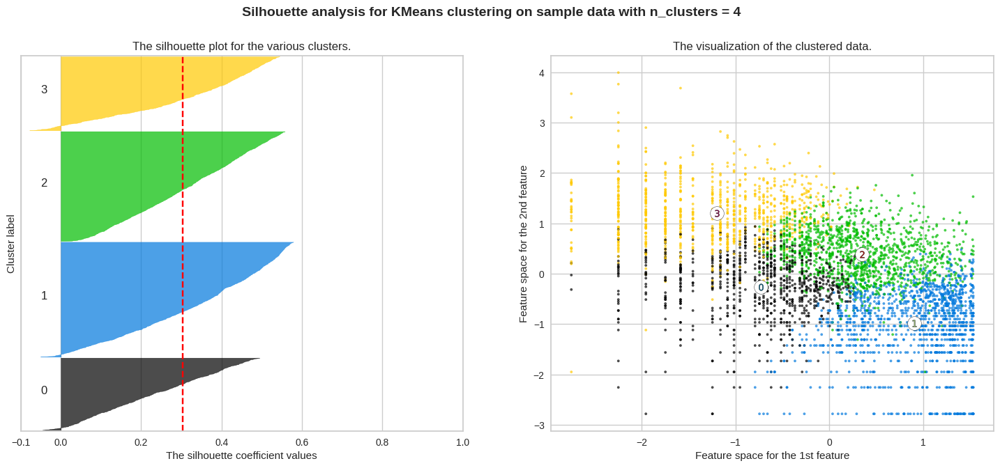

For n_clusters = 5 The average silhouette_score is : 0.27910047312789915


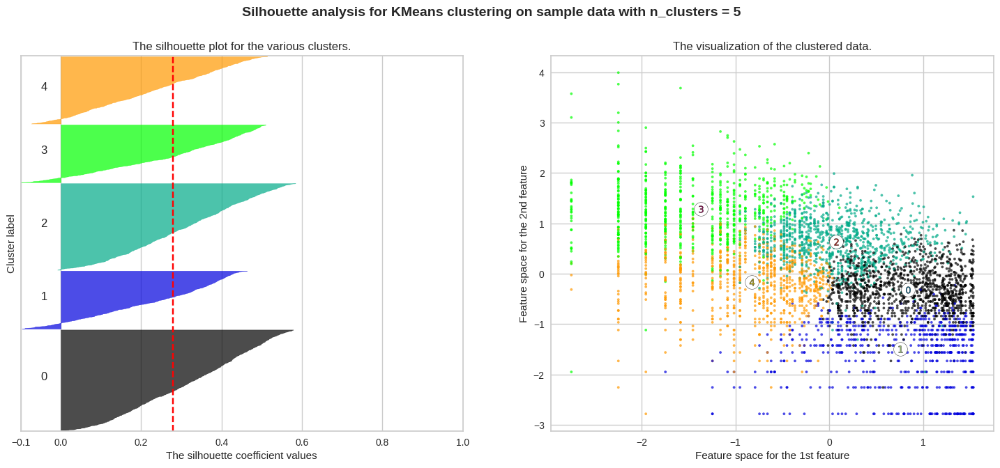

For n_clusters = 6 The average silhouette_score is : 0.27603143591713325


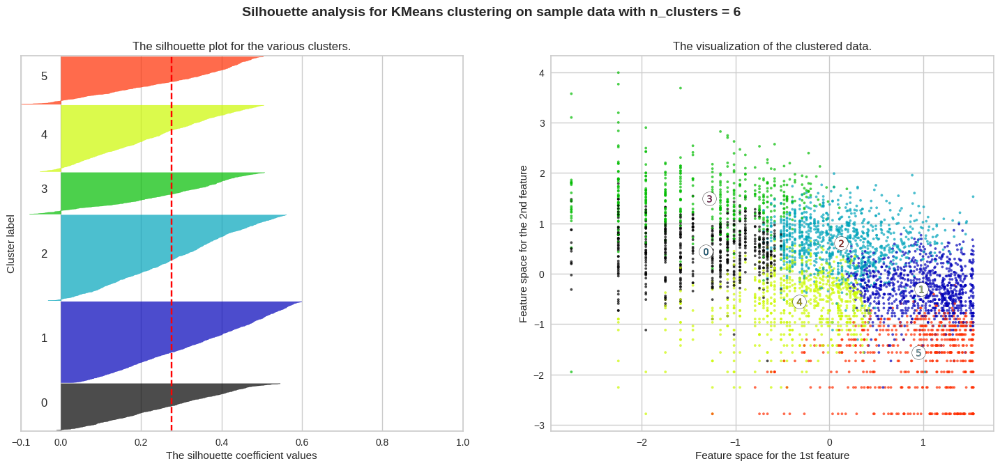

For n_clusters = 7 The average silhouette_score is : 0.2655769199472786


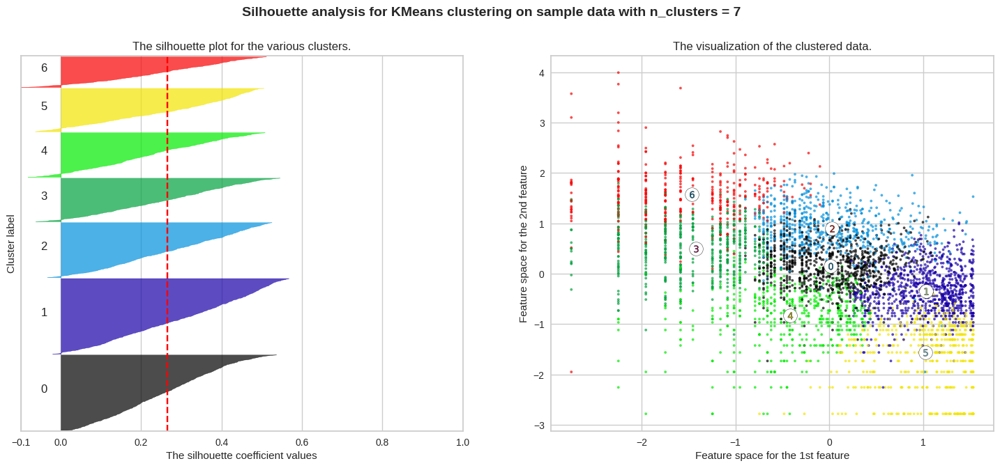

For n_clusters = 8 The average silhouette_score is : 0.26140735071739707


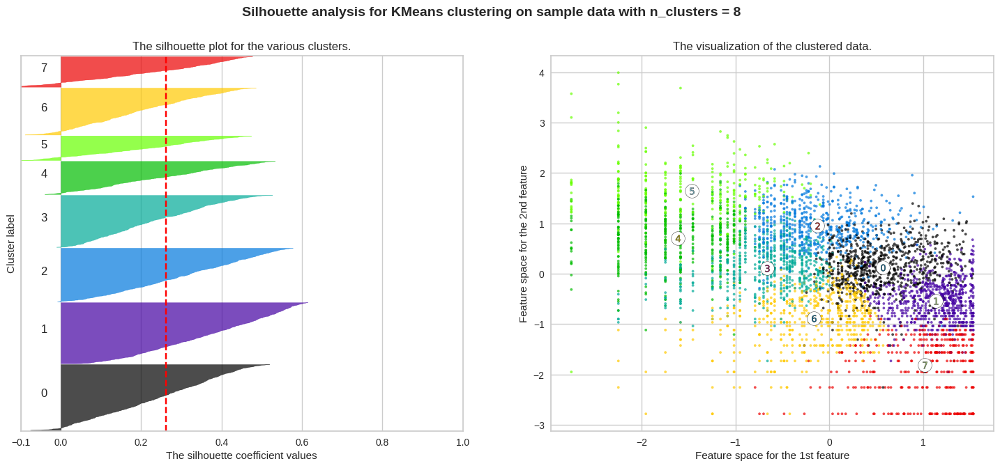

For n_clusters = 9 The average silhouette_score is : 0.26035434709367405


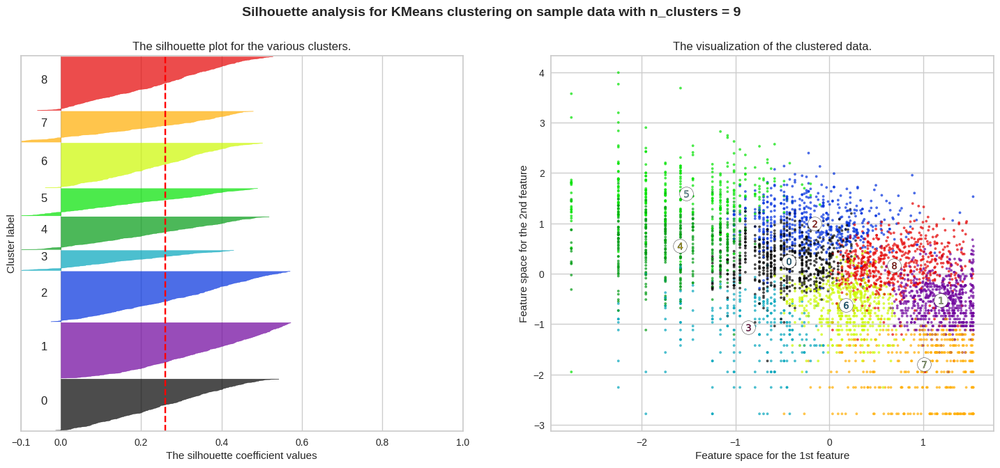

For n_clusters = 10 The average silhouette_score is : 0.25318663842440575


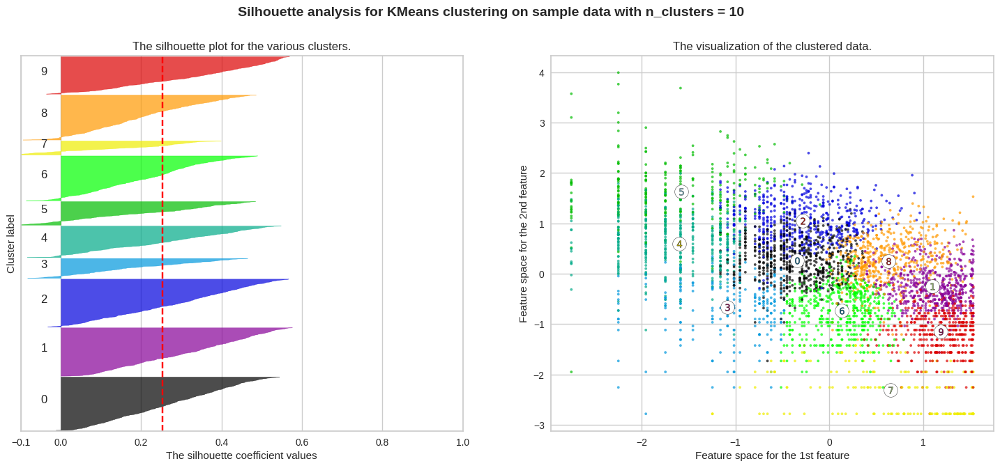

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


range_n_clusters = [2,3,4,5,6,7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,init='k-means++',random_state=1)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_

    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200, edgecolor ='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor ='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()

**So giving n_cluster=2 on Kmeans Model.**

In [ ]:
# Applying kmeans_clustering algorithm
kmeans_freq_mon_rec = KMeans(n_clusters=2)
kmeans_freq_mon_rec.fit(X)
y_means = kmeans_freq_mon_rec.predict(X)

In [ ]:
# Find the clusters for the observation given in the datset
rmf_segmentation['Cluster_based_freq_mon_rec'] = kmeans_freq_mon_rec.labels_
rmf_segmentation.head(10)

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level,Recency_log,Frequency_log,Monetary_log,Cluster_based_rec_mon,Cluster_based_freq_mon,Cluster_based_freq_mon_rec
CustomerID,,,,,,,,,,,,,,,
12346.0,326,1,77183.60,4,4,1,441,9,Silver,5.786897,0.000000,11.253942,0,0,0
12347.0,3,182,4310.00,1,1,1,111,3,Platinaum,1.098612,5.204007,8.368693,0,0,1
12348.0,76,31,1797.24,3,3,1,331,7,Gold,4.330733,3.433987,7.494007,0,0,1
12349.0,19,73,1757.55,2,2,1,221,5,Platinaum,2.944439,4.290459,7.471676,0,0,1
12350.0,311,17,334.40,4,4,3,443,11,Bronz,5.739793,2.833213,5.812338,1,1,0
12352.0,37,85,2506.04,2,2,1,221,5,Platinaum,3.610918,4.442651,7.826459,0,0,1
12353.0,205,4,89.00,4,4,4,444,12,Bronz,5.323010,1.386294,4.488636,1,1,0
12354.0,233,58,1079.40,4,2,2,422,8,Gold,5.451038,4.060443,6.984161,1,0,0
12355.0,215,13,459.40,4,4,3,443,11,Bronz,5.370638,2.564949,6.129921,1,1,0


In [ ]:
# Centers of the cluster(coordinates)
centers = kmeans_freq_mon_rec.cluster_centers_
centers

array([[ 0.5614398 , -0.64664601, -0.6481023 ],
       [-0.69011511,  0.79484956,  0.79663962]])

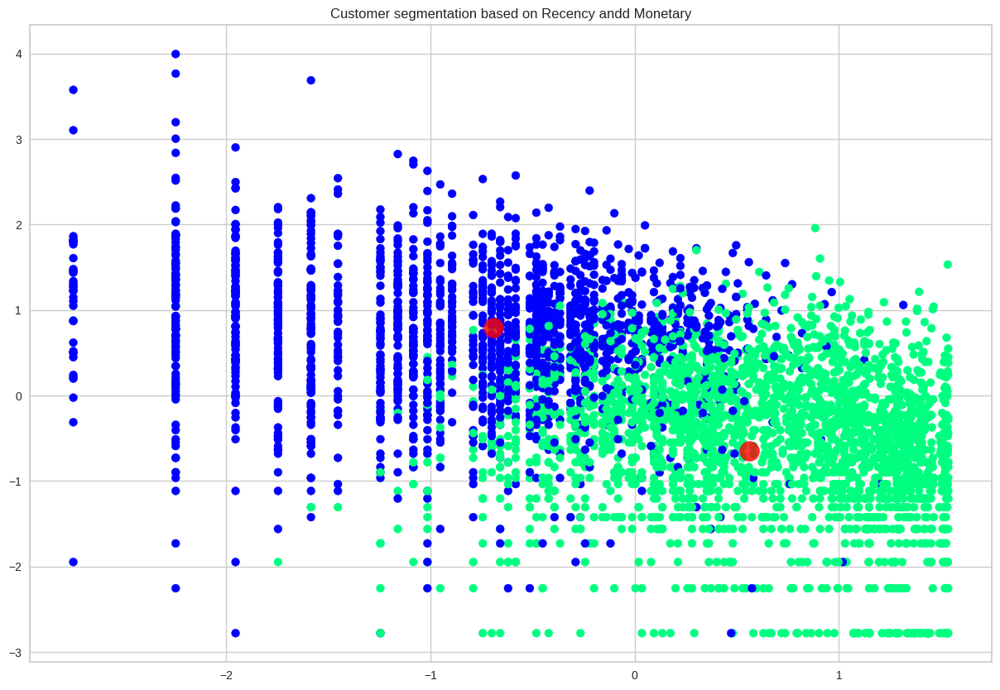

In [ ]:
# Plotting visualizing the clusters
plt.figure(figsize= (15, 10))
plt.title('Customer segmentation based on Recency andd Monetary')
plt.scatter(X[:, 0], X[:, 1], c= y_kmeans, s=50, cmap= 'winter')

centers = kmeans_freq_mon_rec.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s =300, alpha=0.8)


### **DBSCAN Algorithm on Recency, Frequency and Monetary**

In [ ]:
# EPS value is the radius value for the datapoint from which circle is drawn and min sample indicates how many datapoints should be consider that point in cluster
# codesource (sklearn documentation)
db = DBSCAN(eps=0.5, min_samples=10).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0 )
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d'% n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print('Silhouette Coefficient: %.03f' % metrics.silhouette_score(X, labels))


Estimated number of clusters: 2
Estimated number of noise points: 163
Silhouette Coefficient: 0.273


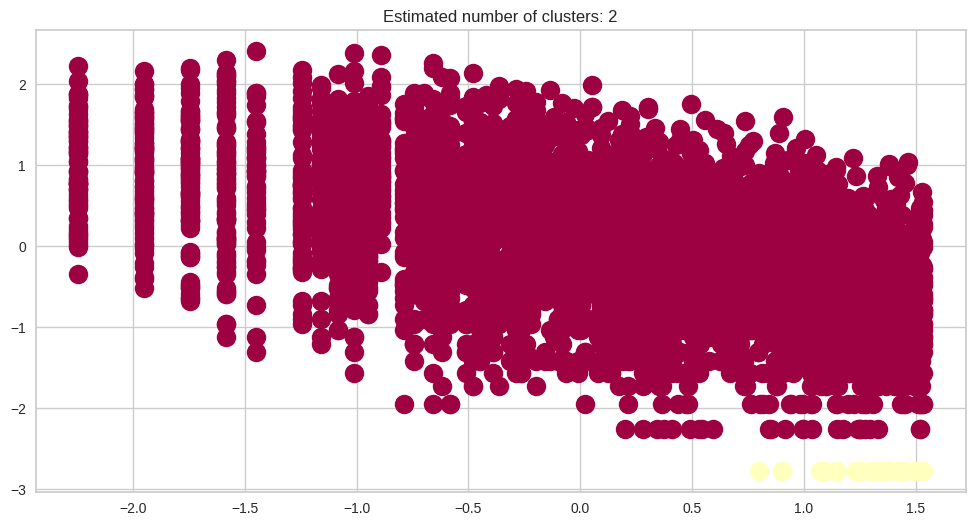

In [ ]:
# Black removed and is used for noise instead
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
plt.figure(figsize=(12, 6))
for k, col in zip(unique_labels, colors):
  if k == -1:
    # black used for noise.
    col = [0, 0, 0, 1]

  class_member_mask = labels == k

  xy = X[class_member_mask & core_samples_mask]
  plt.plot(
      xy[:, 0],
      xy[:, 1],
      'o',
      markerfacecolor = tuple(col),
      markeredgecolor = 'k',
      markersize=14
  )

  zy = X[class_member_mask & ~core_samples_mask]
  plt.plot(
      xy[:, 0],
      xy[:, 1],
      'o',
      markerfacecolor = tuple(col),
      markeredgecolor='k',
      markersize =6
  )
  plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

### **Hierarchical Clustering**

####  How should we choose the number of cluster in Hierarchical Clustering

**Dendrogram Analysis (Visual Inspection):**

**How:**

* Plot the dendrogram and observe the longest vertical lines that are not crossed by horizontal lines.

* The optimal number of clusters is determined by cutting the dendrogram at a height that maximizes the separation between clusters.

Interpretation:

* Larger vertical distances indicate more distinct clusters.

* Cut the dendrogram where there is the largest "gap" between merges.

In [ ]:
import scipy.cluster.hierarchy as shc

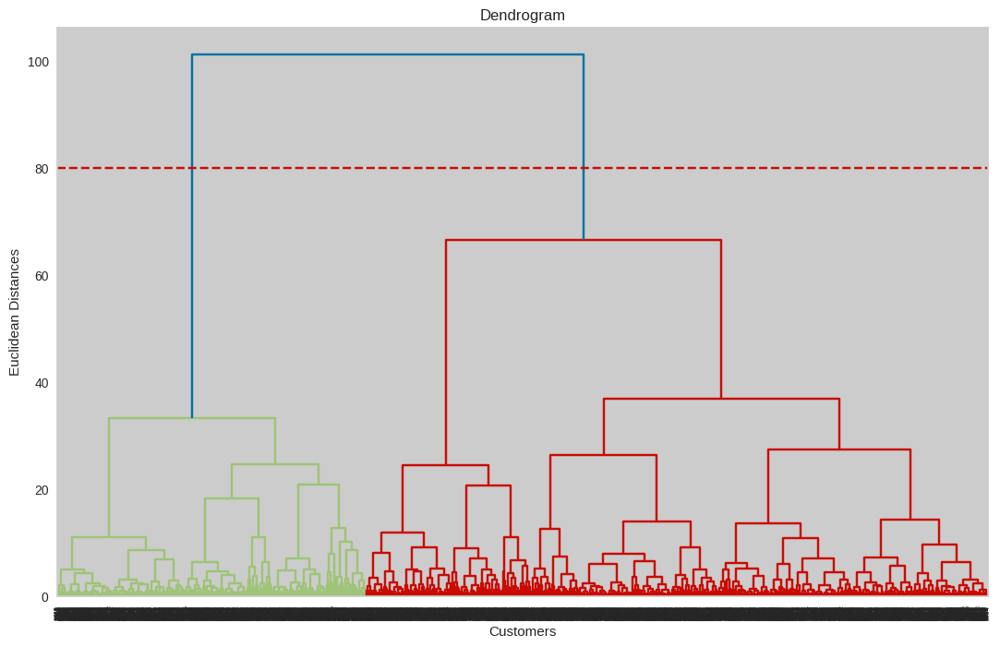

In [ ]:
plt.figure(figsize=(13, 8))
dendrogram = shc.dendrogram(shc.linkage(X, method = 'ward'))

plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distances')
plt.axhline(y=80, color = 'r', linestyle='--')
plt.show()
# find largest vertical distance we can without crossing any other horizontal line

**The number of clusters will be the number of vertical lines which are being intersected by the  red line drawn using the threshold.**

Nunber of Clusters = 2

In [ ]:
# Fitting hierarchical clustering to the mall datset
from sklearn.cluster import AgglomerativeClustering
h_clustering = AgglomerativeClustering(n_clusters = 2, metric = 'euclidean', linkage= 'ward')
h_hc = h_clustering.fit_predict(X)

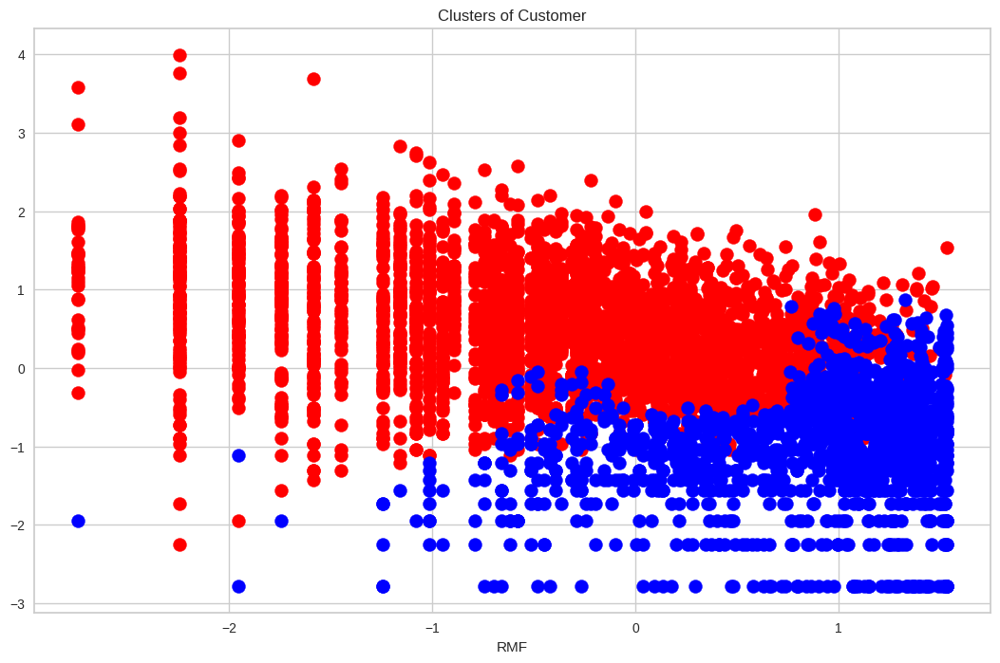

In [ ]:
# Visualizing the clusters (two dimensions only)
plt.figure(figsize=(13, 8))
plt.scatter(X[h_hc == 0, 0], X[h_hc == 0, 1], s = 100, c = 'red', label = 'Customer 1')
plt.scatter(X[h_hc == 1, 0], X[h_hc == 1, 1], s = 100, c = 'blue', label= 'Customer 2')

plt.title('Clusters of Customer')
plt.xlabel("RMF")
plt.show()

In [ ]:
rmf_segmentation.head(2)

,Recency,Frequency,Monetary,R,F,M,RFM_Group,RMF_Score,RMF_Level,Recency_log,Frequency_log,Monetary_log,Cluster_based_rec_mon,Cluster_based_freq_mon,Cluster_based_freq_mon_rec
CustomerID,,,,,,,,,,,,,,,
12346.0,326,1,77183.6,4,4,1,441,9,Silver,5.786897,0.000000,11.253942,0,0,0
12347.0,3,182,4310.0,1,1,1,111,3,Platinaum,1.098612,5.204007,8.368693,0,0,1


In [ ]:
# @title Default title text
data_process_normalized = rmf_segmentation[['Recency',	'Frequency','Monetary',	'Recency_log',	'Frequency_log',
                                            'Monetary_log', 'RMF_Level',	'Cluster_based_freq_mon_rec']]

In [ ]:
data_process_normalized.groupby('Cluster_based_freq_mon_rec').agg({
    'Recency': ['mean', 'min', 'max'],
    'Frequency': ['mean', 'min', 'max'],
    'Monetary': ['mean', 'min', 'max', 'count']
})

Recency            Frequency            \
                                  mean min  max        mean min   max   
Cluster_based_freq_mon_rec                                              
0                           142.732359   2  374   24.541127   1   174   
1                            31.831189   1  373  171.855893   1  7676   

                               Monetary                           
                                   mean     min        max count  
Cluster_based_freq_mon_rec                                        
0                            465.988477    3.75   77183.60  2395  
1                           3999.571020  150.61  280206.02  1943

##  ***Conclusions***

* The Dataset was large enough summing around 5.4 lakh samples & we used a 10k subsamples for creation of the model.

* For the segmentation we used RMF Technique to create working table as it is most common segmentation technique.

*